In [ ]:
# basic stuff 
from scipy import stats, signal, io
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random
# from google.colab import files
import os
import seaborn as sn

# torch stuff
import torch
from torch.utils.data import Dataset, DataLoader, Subset
from torch import nn
import torch.nn.functional as F

# !pip install mat73
# import mat73

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import sys
sys.path.append('/content/drive/MyDrive/Miller_Lab/FIU/PopFRData/')
sys.path.append('/content/drive/MyDrive/Miller_Lab/FIU/xds_python/')
sys.path.append('/content/drive/MyDrive/Miller_Lab/FIU/custom_functions/')

In [27]:
import importlib
import data_loading
import train_test
import r2_pr2
import models
import visualization

importlib.reload(visualization)

<module 'visualization' from '/content/drive/MyDrive/Miller_Lab/FIU/custom_functions/visualization.py'>

In [ ]:
plt.rcParams.update({'font.size': 15})

Load datasets

In [ ]:
dataset_dict_fr = data_loading.load_datasets('/content/drive/My Drive/Miller_Lab/FIU/PopFRData/processed_shuffled_opensim_datasets/fullyrestrained')
loader_dict_fr = data_loading.get_loaders(dataset_dict_fr, 32)

In [ ]:
# dataset_dict_sr = data_loading.load_datasets('/content/drive/My Drive/Miller_Lab/FIU/PopFRData/processed_shuffled_opensim_datasets/semirestrained')
# loader_dict_sr = data_loading.get_loaders(dataset_dict_sr, 32)

In [ ]:
tcnn_dataset_dict_fr = data_loading.load_datasets('/content/drive/My Drive/Miller_Lab/FIU/PopFRData/tcnn_processed_shuffled_opensim_datasets/instance_length_100/fullyrestrained')
tcnn_loader_dict_fr = data_loading.get_loaders(tcnn_dataset_dict_fr, 32)

In [ ]:
# tcnn_dataset_dict_sr = data_loading.load_datasets('/content/drive/My Drive/Miller_Lab/FIU/PopFRData/tcnn_processed_shuffled_opensim_datasets/instance_length_100/semirestrained')
# tcnn_loader_dict_sr = data_loading.get_loaders(tcnn_dataset_dict_sr, 32)

Load MLPs

In [ ]:
mlp_models_dict = {}
base_dir = '/content/drive/My Drive/Miller_Lab/FIU/MLP/Pop_FR_OpenSIM/NonSplit/fullyrestrained/mse_loss/'
for date in os.listdir(base_dir):
    print(date)
    full_dir = os.path.join(base_dir, date, 'MLP_{}_Joint Angles_3_layers_reluadded'.format(date))
    model = models.FCNet(24, dataset_dict_fr[date]['Joint Angles']['Full'].num_neural_units, 3, 112, add_relu = True)
    model.load_state_dict(torch.load(full_dir))
    mlp_models_dict[date] = model

20220224
20211209
20211207uc
20211206uc
20211206pipe
20211203
20211119uc
20211119stick
20211116uc
20211116stick
20210928
20210710
20210712
20210814
20211105
20220309
20211207pipe
20211208pipe
20211208uc
20220210uc
20220210pipe


Load TCNs

In [ ]:
causal_dict = {'20210928': True,
'20220224': True,
'20211209': True,
'20211207uc': True,
'20211206uc': True,
'20211206pipe': True,
'20211203': True,
'20211119uc': True,
'20211119stick': True,
'20211116uc': True,
'20211116stick': True,
'20210710': True,
'20210712': False,
'20210814': True,
'20211105': True,
'20220309': True,
'20220210uc': True,
'20220210pipe': True,
'20211208uc': True,
'20211208pipe': True,
'20211207pipe': True,
}

In [ ]:
tcn_models_dict = {}

base_dir = '/content/drive/My Drive/Miller_Lab/FIU/Temporal_CNN/Pop_FR_OpenSIM/Standard/NonSplit/instance_length_100/fullyrestrained/mse_loss/'
for date in os.listdir(base_dir):
    print(date)
    full_dir = os.path.join(base_dir, date, 'TempCNN_{}_Joint Angles_4_convlayers_reluadded'.format(date))
    model = models.TempConvNet(24, tcnn_dataset_dict_fr[date]['Joint Angles']['Full'].num_neural_units, 4, 1, 5, 2, add_relu = True, causal=causal_dict[date])
    model.load_state_dict(torch.load(full_dir))
    tcn_models_dict[date] = model

20220224
20211209
20211207uc
20211206uc
20211206pipe
20211203
20211119uc
20211119stick
20211116uc
20211116stick
20210928
20210710
20210712
20210814
20211105
20220309
20211207pipe
20211208pipe
20211208uc
20220210uc
20220210pipe


In [ ]:
tcn_tl_models_dict = {}

base_dir = '/content/drive/My Drive/Miller_Lab/FIU/Temporal_CNN/Pop_FR_OpenSIM/TransferLearning/NonSplit/fullyrestrained/'
for date in os.listdir(base_dir):
    print(date)
    full_dir = os.path.join(base_dir, date, 'TempCNN_{}_3_convlayers_reluadded'.format(date))
    model = models.TempConvNet(24, tcnn_dataset_dict_fr[date]['Joint Angles']['Full'].num_neural_units, 3, 1, 5, 2, add_relu = True, causal=True)
    model.load_state_dict(torch.load(full_dir))
    tcn_tl_models_dict[date] = model

20210814
20210712
20210710
20210928
20211105
20211207pipe
20211207uc
20211209
20211208uc
20211208pipe
20220210uc
20220210pipe
20220309
20220224


# TCN vs MLP

108 108 108
(108, 3)
TCN average pR2: -4.224651336669922
MLP average pR2: -0.7437388896942139


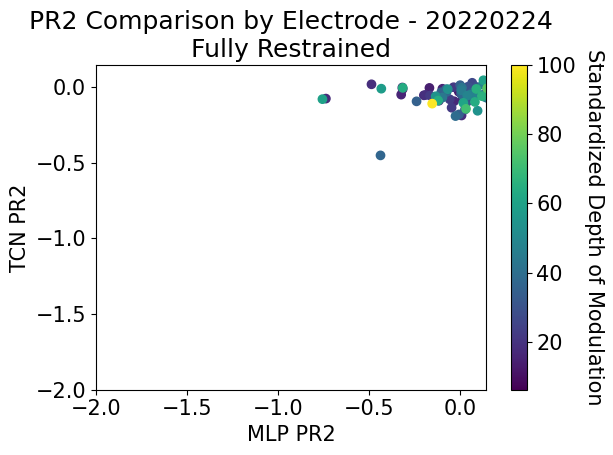

104 104 104
(104, 3)
TCN average pR2: -0.46484217047691345
MLP average pR2: -0.23349499702453613


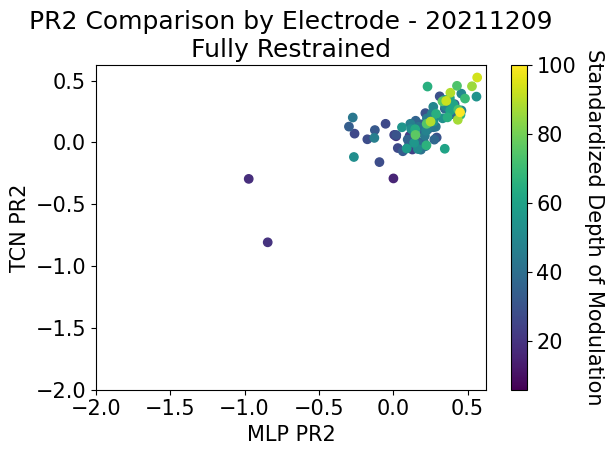

83 83 83
(83, 3)
TCN average pR2: -2.4213356971740723
MLP average pR2: -1.1575359106063843


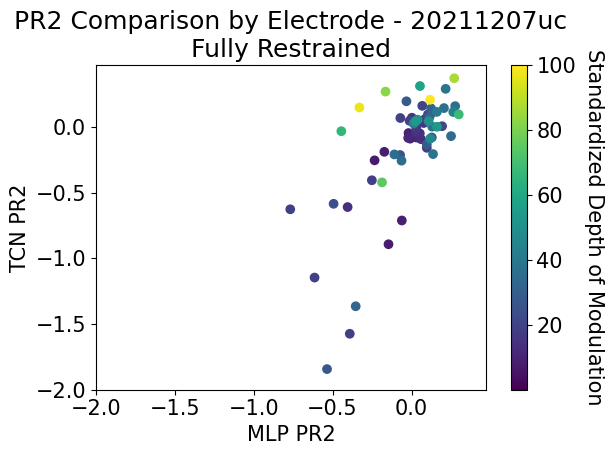

99 99 99
(99, 3)
TCN average pR2: -2.142503499984741
MLP average pR2: -0.51275235414505


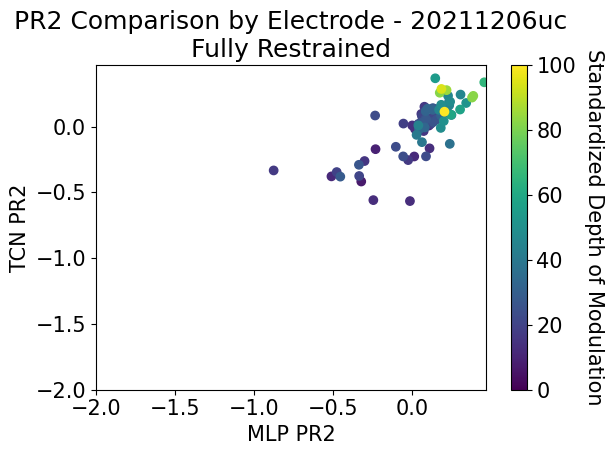

75 75 75
(75, 3)
TCN average pR2: -1.8504711389541626
MLP average pR2: -0.7284542918205261


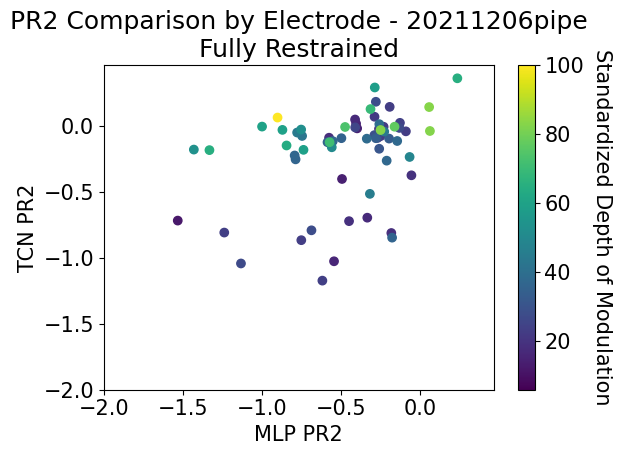

25 25 25
(25, 3)
TCN average pR2: -2.2625067234039307
MLP average pR2: -0.6121853590011597


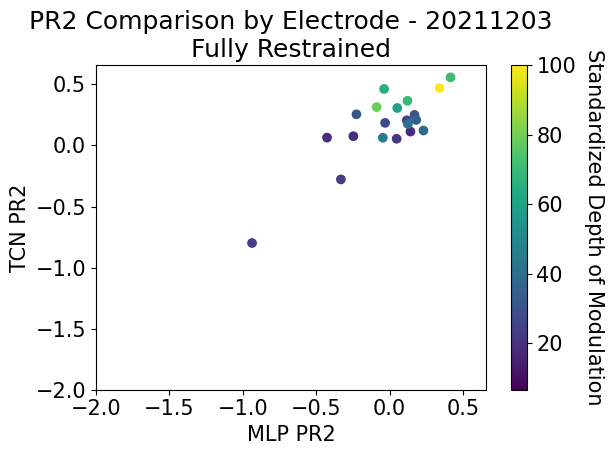

84 84 84
(84, 3)
TCN average pR2: -6.073428630828857
MLP average pR2: -1.2232524156570435


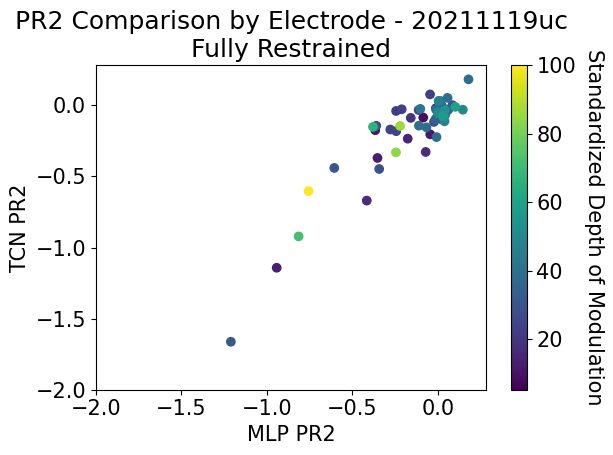

83 83 83
(83, 3)
TCN average pR2: -3.1948840618133545
MLP average pR2: -0.618817150592804


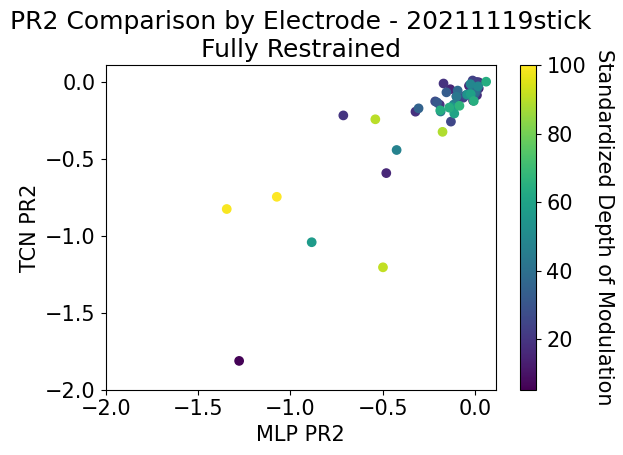

80 80 80
(80, 3)
TCN average pR2: -2.9185614585876465
MLP average pR2: -0.7236844301223755


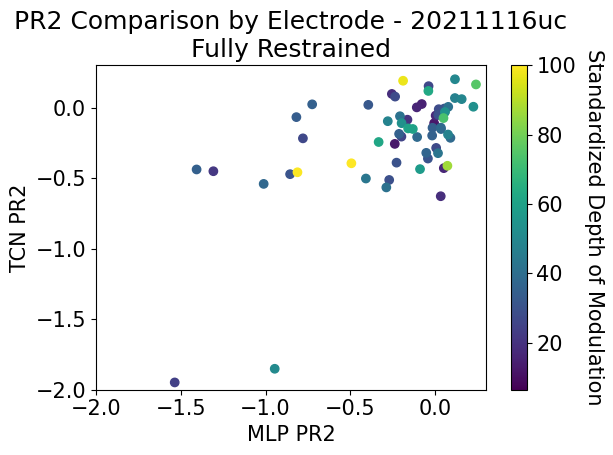

95 95 95
(95, 3)
TCN average pR2: -0.7983154058456421
MLP average pR2: -1.0931134223937988


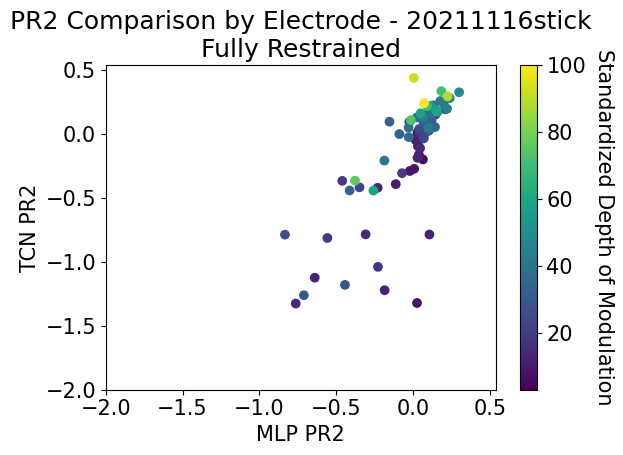

84 84 84
(84, 3)
TCN average pR2: -1.5319154262542725
MLP average pR2: -0.3956335484981537


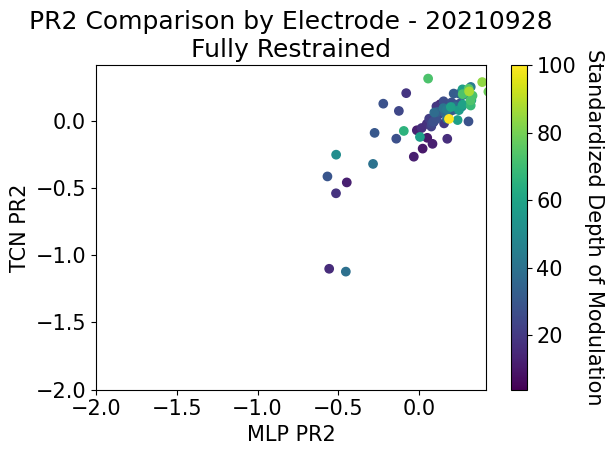

153 153 153
(153, 3)
TCN average pR2: -0.6505478024482727
MLP average pR2: -0.4248482584953308


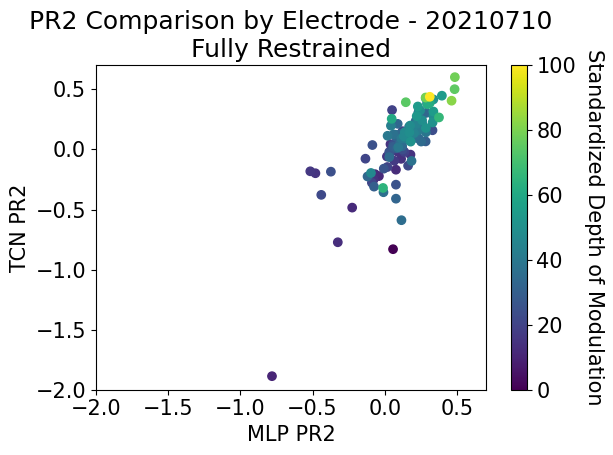

142 142 142
(142, 3)
TCN average pR2: -0.5316894054412842
MLP average pR2: -0.18218795955181122


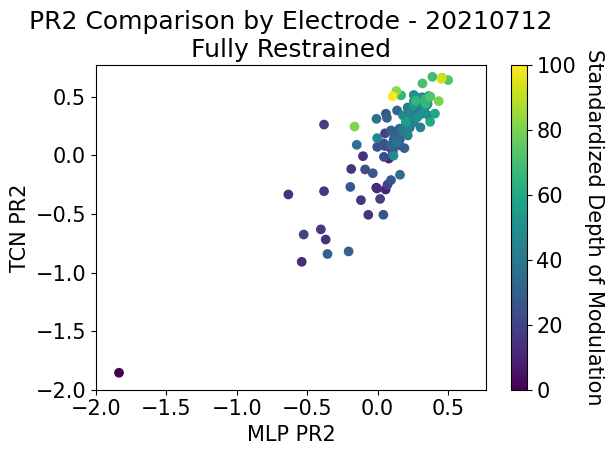

145 145 145
(145, 3)
TCN average pR2: -1.0629850625991821
MLP average pR2: -0.8183861374855042


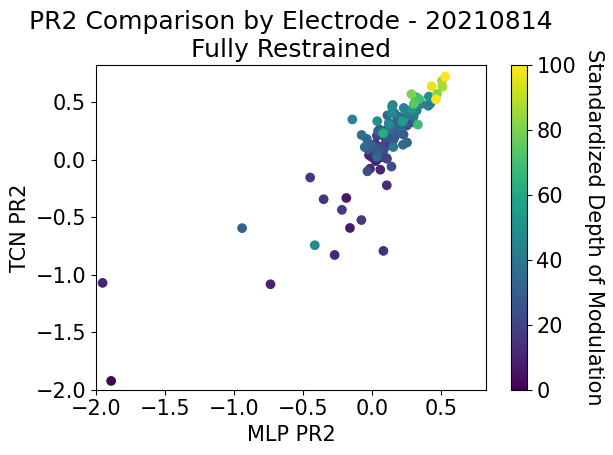

113 113 113
(113, 3)
TCN average pR2: -2.307448148727417
MLP average pR2: -0.8653988242149353


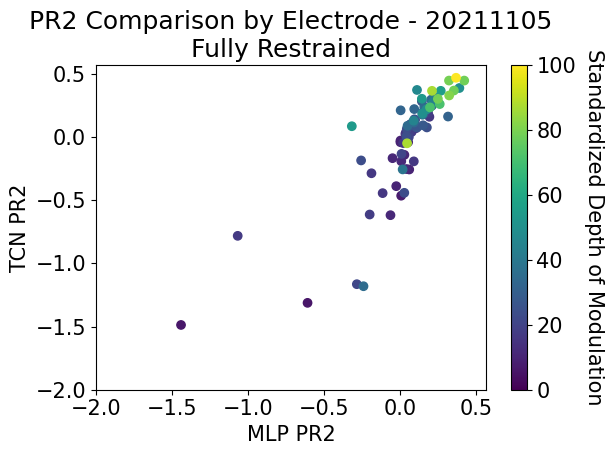

96 96 96
(96, 3)
TCN average pR2: -0.7835392951965332
MLP average pR2: -0.703851044178009


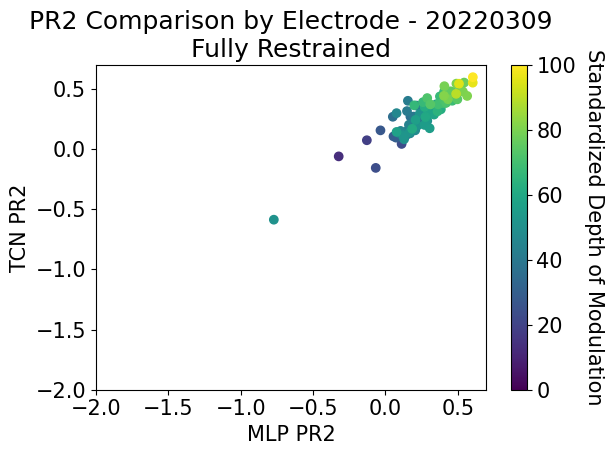

90 90 90
(90, 3)
TCN average pR2: -3.187164545059204
MLP average pR2: -1.485343098640442


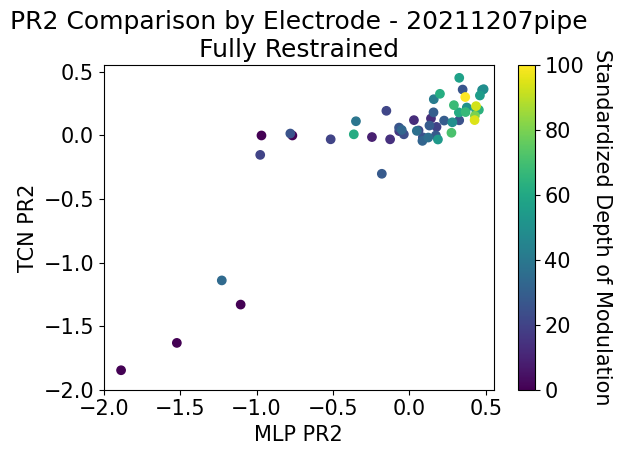

96 96 96
(96, 3)
TCN average pR2: -2.629171133041382
MLP average pR2: 0.27780887484550476


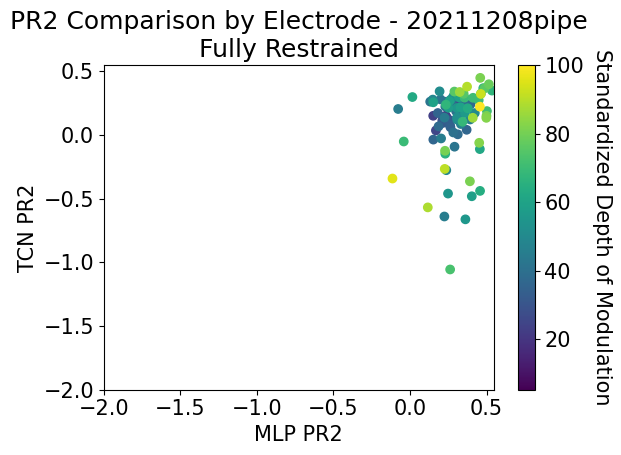

96 96 96
(96, 3)
TCN average pR2: -1.2996885776519775
MLP average pR2: 0.188319131731987


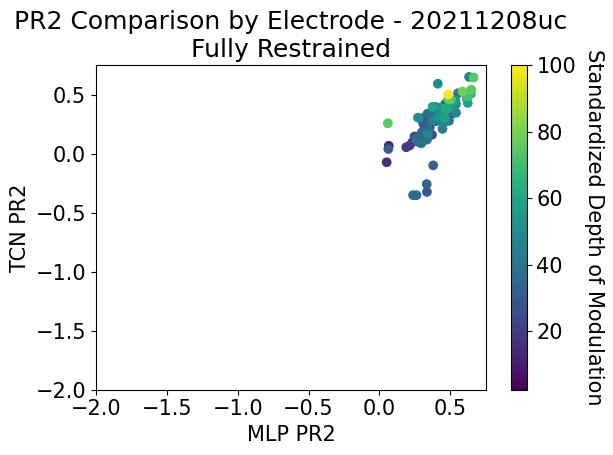

96 96 96
(96, 3)
TCN average pR2: -7.915191650390625
MLP average pR2: -2.107774019241333


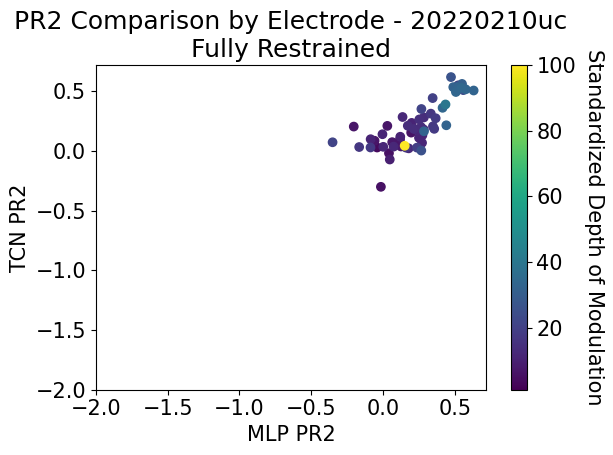

96 96 96
(96, 3)
TCN average pR2: -4.967082977294922
MLP average pR2: -1.3280142545700073


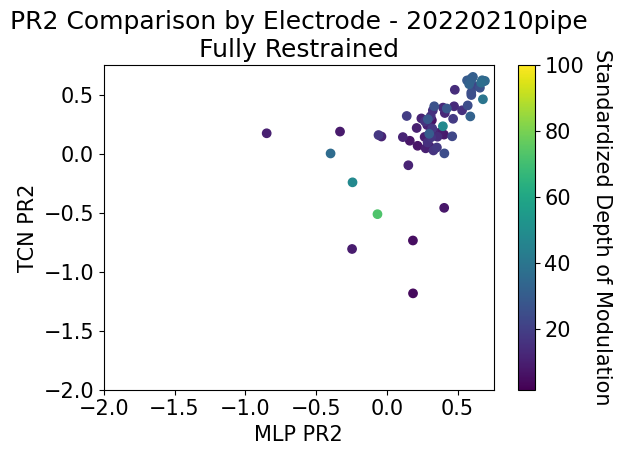

In [ ]:
for date in tcn_models_dict.keys():
    model_1_name = 'TCN'
    model1 = tcn_models_dict[date]
    dataset1 = tcnn_dataset_dict_fr[date]['Joint Angles']['Full']
    test_loader1 = tcnn_loader_dict_fr[date]['Joint Angles']['Test']
    conv1 = True
    model_2_name = 'MLP'
    model2 = mlp_models_dict[date]
    dataset2 = dataset_dict_fr[date]['Joint Angles']['Full']
    test_loader2 = loader_dict_fr[date]['Joint Angles']['Test']
    conv2 = False
    restraint_type = 'Fully Restrained'
    visualization.compare_pr2_plots(model_1_name, model1, dataset1, test_loader1, conv1, 
                                model_2_name, model2, dataset2, test_loader2, conv2, 
                                restraint_type, exclude_bad_neurons = False, min_plot_val = -2)

TCN average pR2: -2.453800262104381
MLP average pR2: -0.01816541931845925


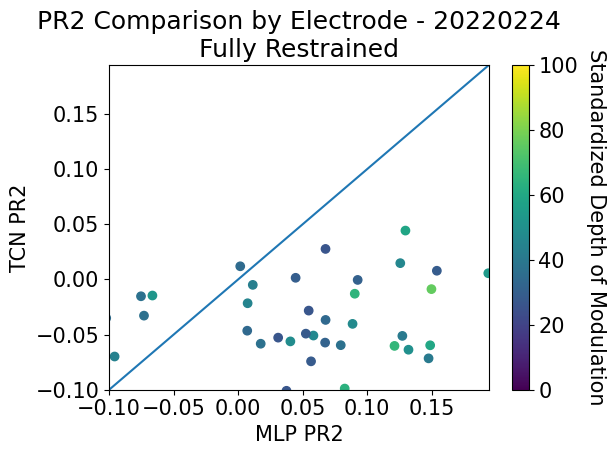

TCN average pR2: 0.1687239498462317
MLP average pR2: 0.24540854175135773


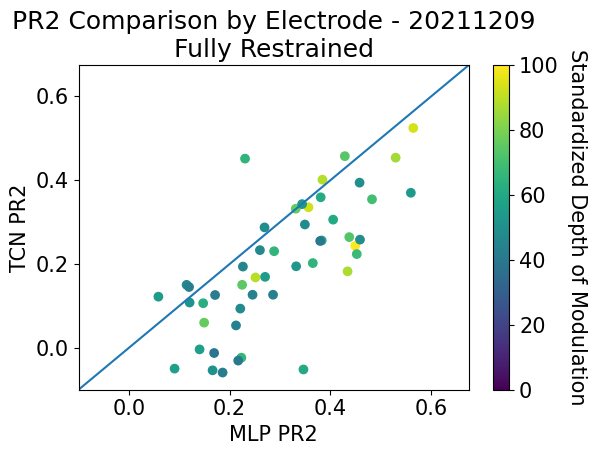

TCN average pR2: -0.10104588525635856
MLP average pR2: -0.015560486486979894


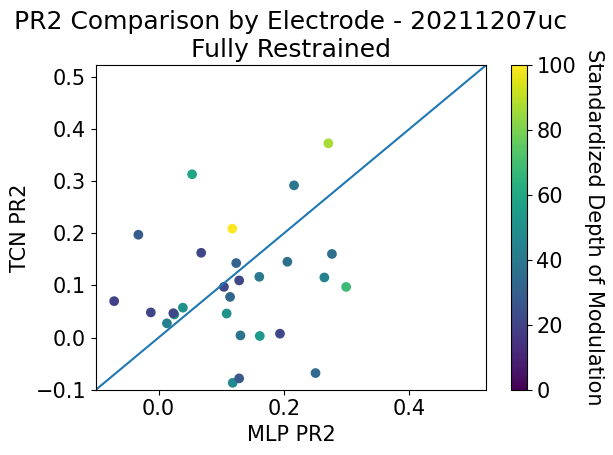

TCN average pR2: -0.1477912163734436
MLP average pR2: 0.0999685537815094


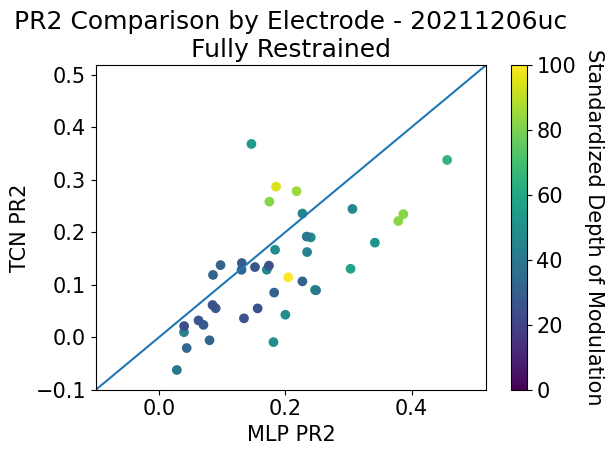

TCN average pR2: -0.11761517587460969
MLP average pR2: -0.49111991179616826


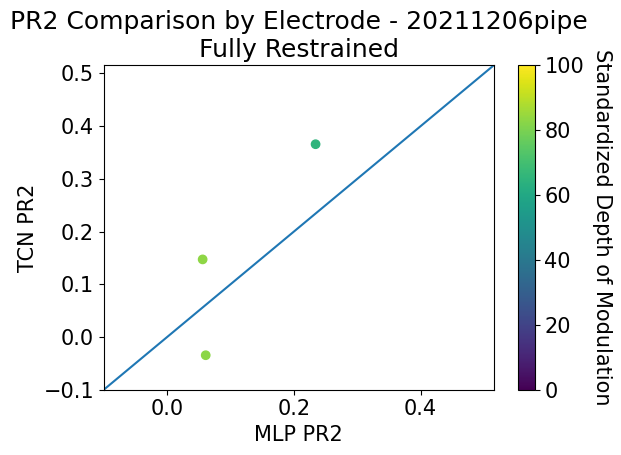

TCN average pR2: 0.19635270650570208
MLP average pR2: 0.018548768300276536


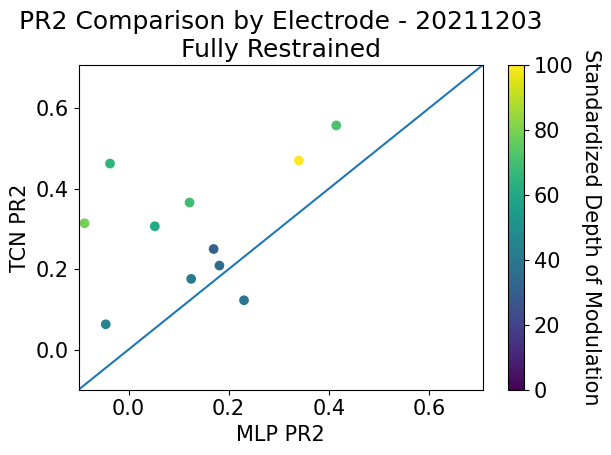

TCN average pR2: -7.169895818067151
MLP average pR2: -0.19590269687563874


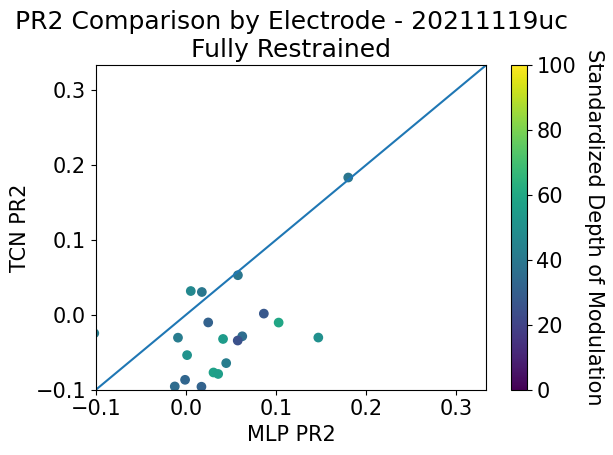

TCN average pR2: -1.7445083615325747
MLP average pR2: -0.2737886678604853


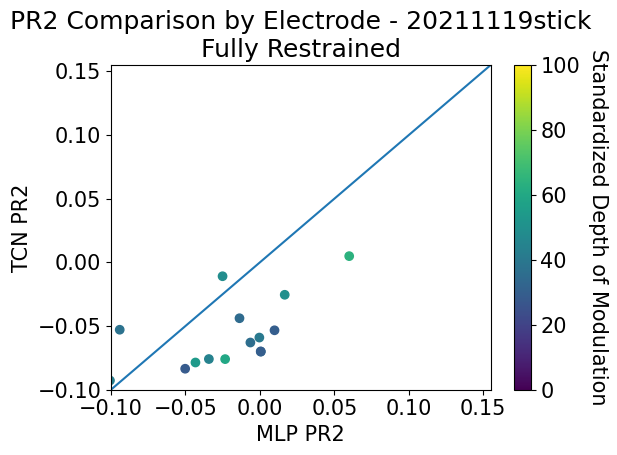

TCN average pR2: -1.489317453489071
MLP average pR2: -0.25452510612766915


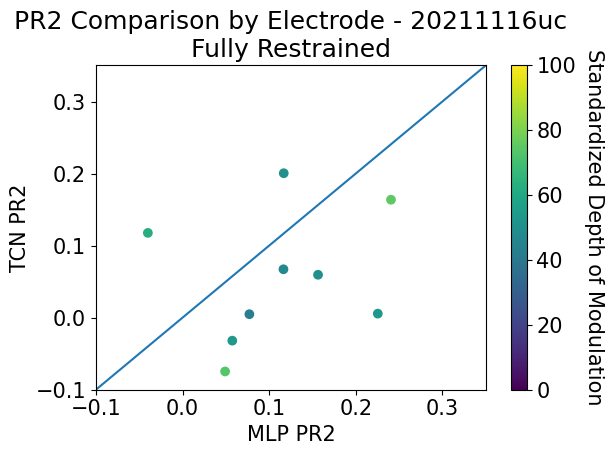

TCN average pR2: 0.018886288007100422
MLP average pR2: -1.0733512714505196


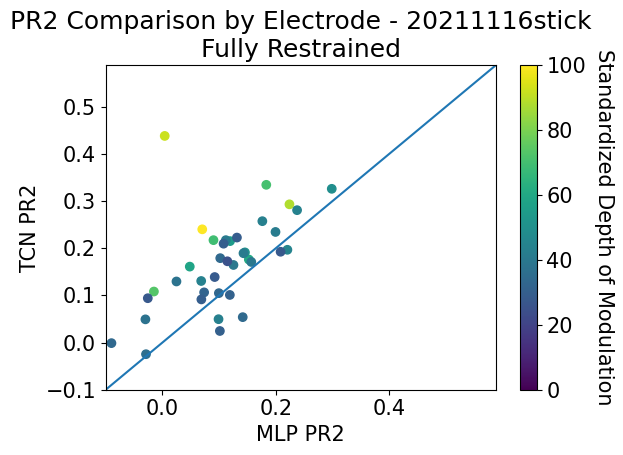

TCN average pR2: -0.2704790511796641
MLP average pR2: 0.08803543379140455


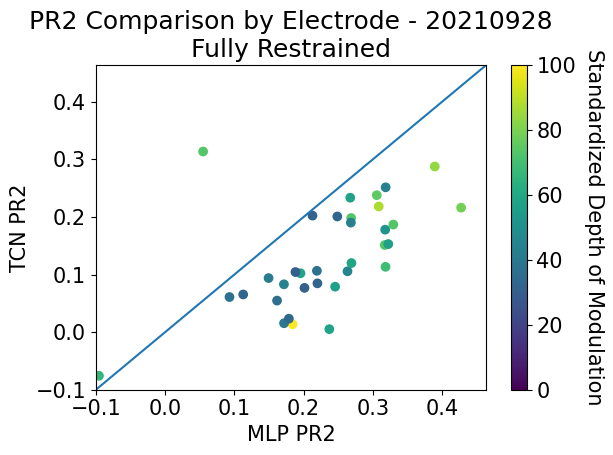

TCN average pR2: 0.14449378499737034
MLP average pR2: 0.17581028907330004


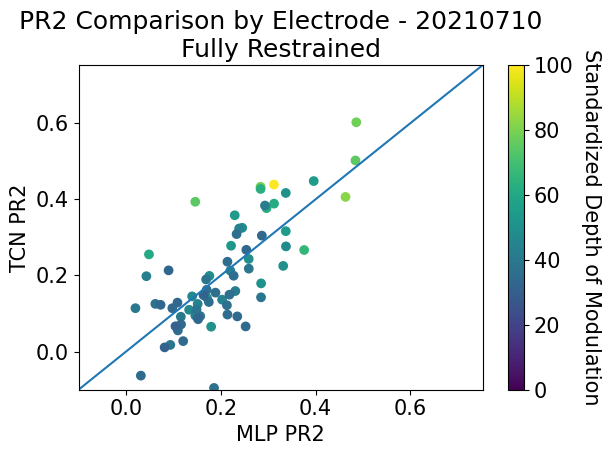

TCN average pR2: 0.3344889498419232
MLP average pR2: 0.23389792939027151


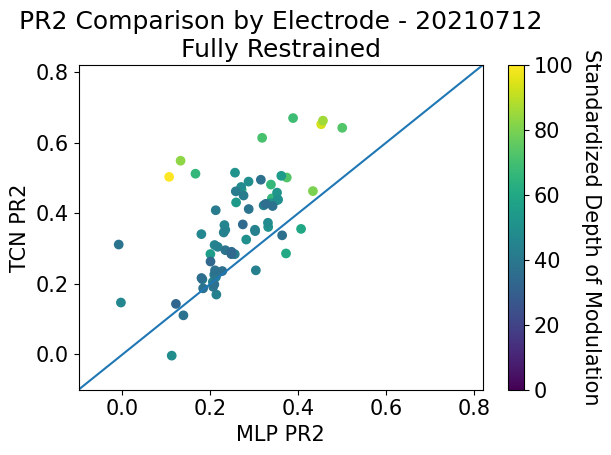

TCN average pR2: 0.2754470412045309
MLP average pR2: 0.15120072152516614


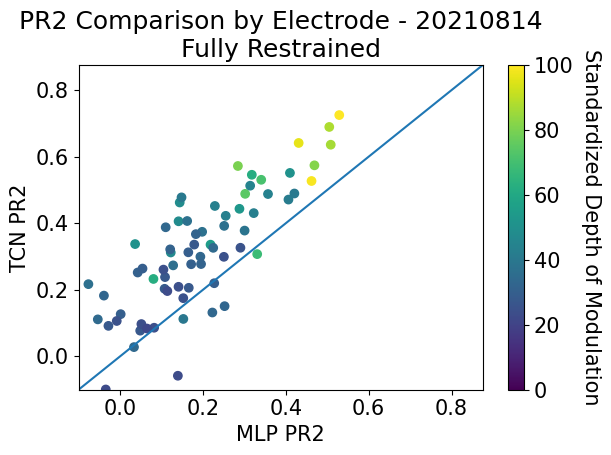

TCN average pR2: 0.08022810597168772
MLP average pR2: 0.09871030585807666


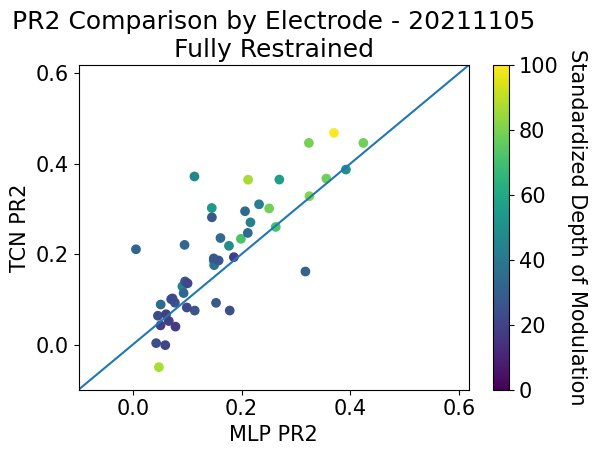

TCN average pR2: 0.3450016488834303
MLP average pR2: 0.34102695937059363


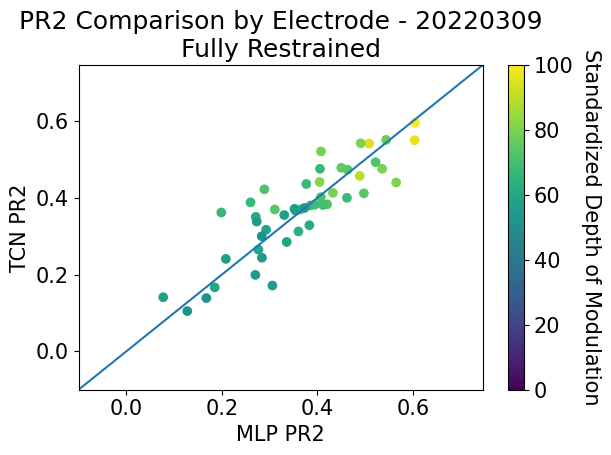

TCN average pR2: -0.5514046394306681
MLP average pR2: -0.03445493267930072


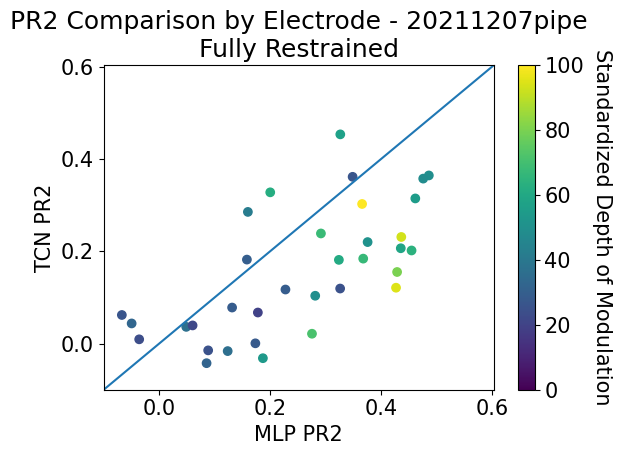

TCN average pR2: -0.4379071921718364
MLP average pR2: 0.2892936930364492


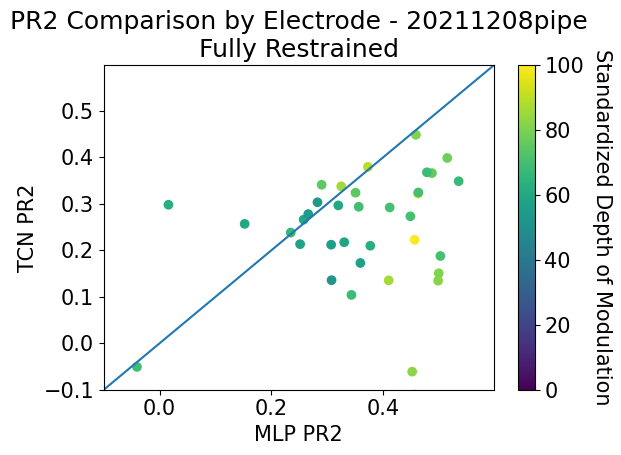

TCN average pR2: 0.35947806859502984
MLP average pR2: 0.43946269337011845


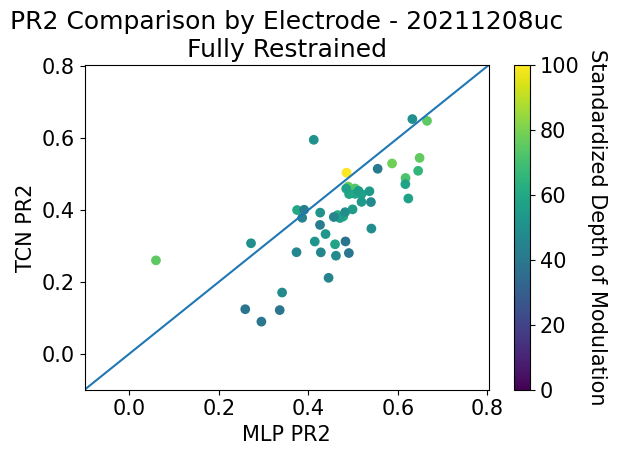

TCN average pR2: -0.9244430600380411
MLP average pR2: 0.23454563715020005


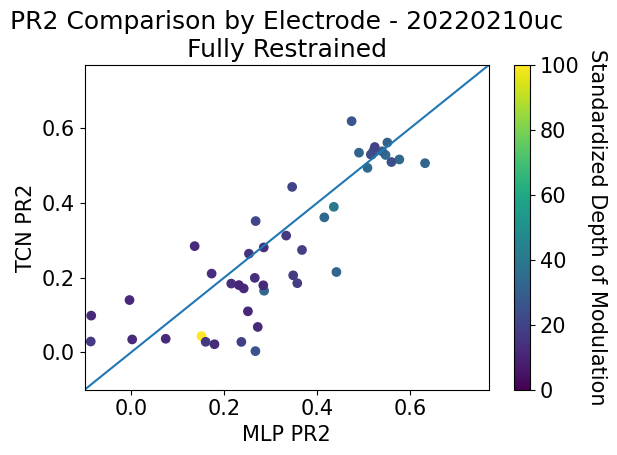

TCN average pR2: 0.2735960301087827
MLP average pR2: -0.6939753160184744


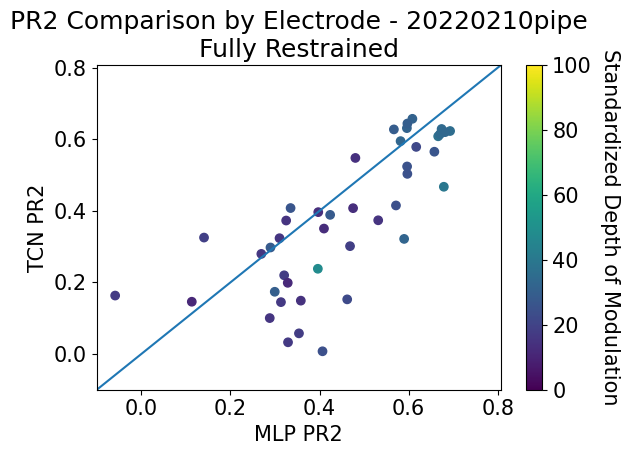

In [ ]:
for date in tcn_models_dict.keys():
    model_1_name = 'TCN'
    model1 = tcn_models_dict[date]
    dataset1 = tcnn_dataset_dict_fr[date]['Joint Angles']['Full']
    test_loader1 = tcnn_loader_dict_fr[date]['Joint Angles']['Test']
    conv1 = True
    model_2_name = 'MLP'
    model2 = mlp_models_dict[date]
    dataset2 = dataset_dict_fr[date]['Joint Angles']['Full']
    test_loader2 = loader_dict_fr[date]['Joint Angles']['Test']
    conv2 = False
    restraint_type = 'Fully Restrained'
    visualization.compare_pr2_plots(model_1_name, model1, dataset1, test_loader1, conv1, 
                                model_2_name, model2, dataset2, test_loader2, conv2, 
                                restraint_type, exclude_bad_neurons = True)

In [ ]:
for date in tcn_models_dict.keys():
    dataset = tcnn_dataset_dict_fr[date]['Joint Angles']['Full']
    tcn_model = tcn_models_dict[date]
    tcn_good_range_arrays = tcnn_dataset_dict_fr[date]['Joint Angles']['GoodRange']
    mlp_model = mlp_models_dict[date]
    mlp_good_range_arrays = tcnn_dataset_dict_fr[date]['Joint Angles']['GoodRange']

    dataset_array_output = data_loading.convert_osim_dataset_to_array(dataset)
    top_3_electrodes = visualization.depth_of_modulation(dataset_array_output[1], return_top_n = 3)[1]
    visualization.plot_compare_electrodes_subset(date, mlp_model, mlp_good_range_arrays, tcn_model, tcn_good_range_arrays, top_3_electrodes)

Output hidden; open in https://colab.research.google.com to view.

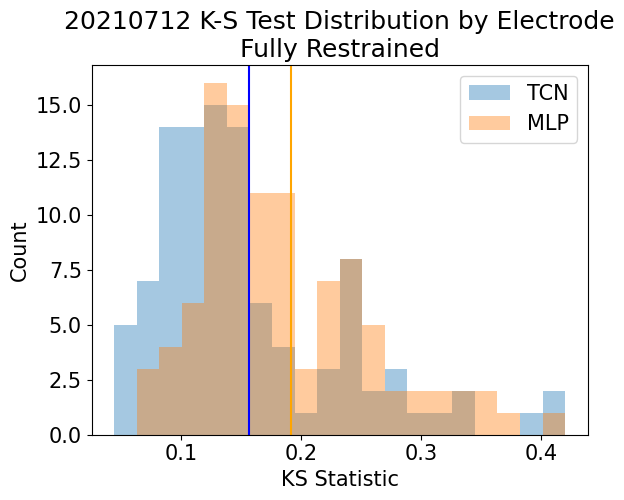

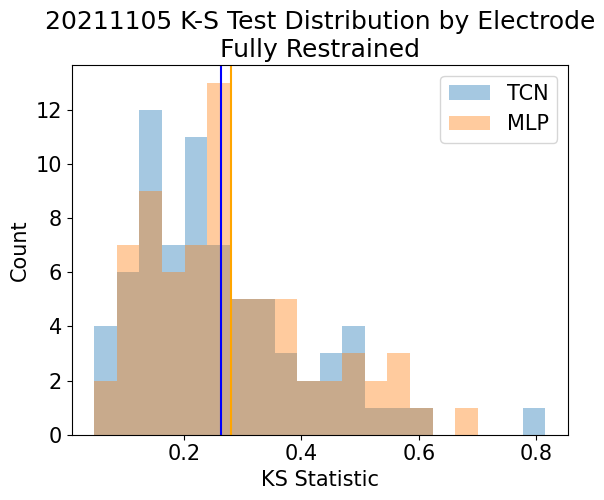

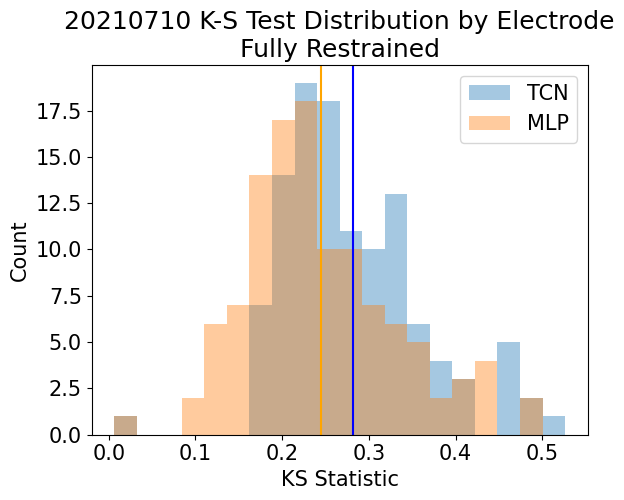

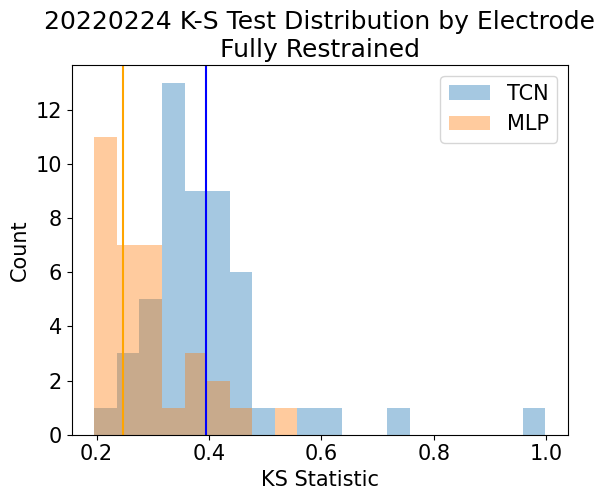

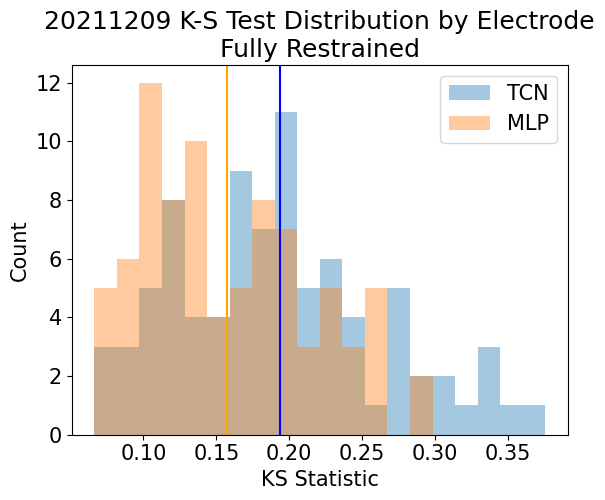

...

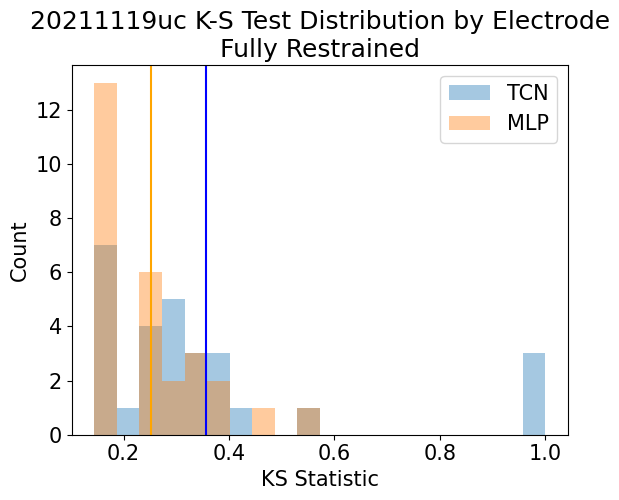

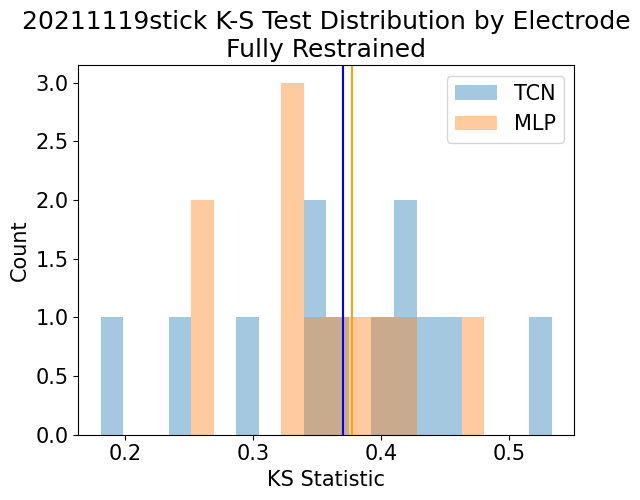

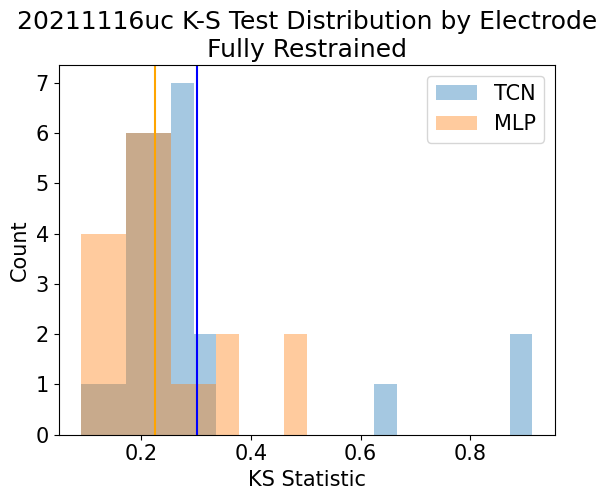

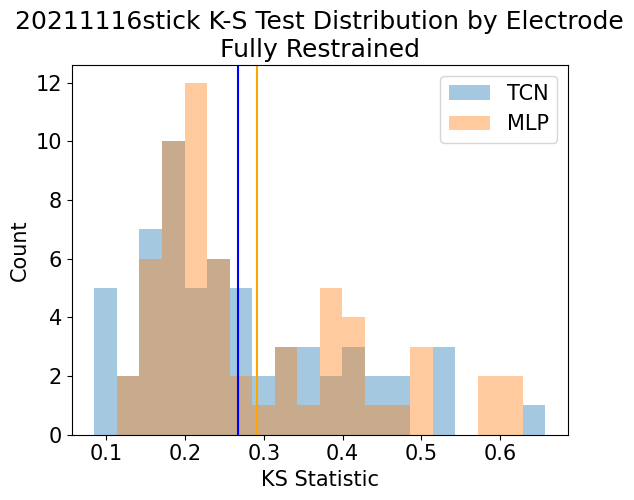

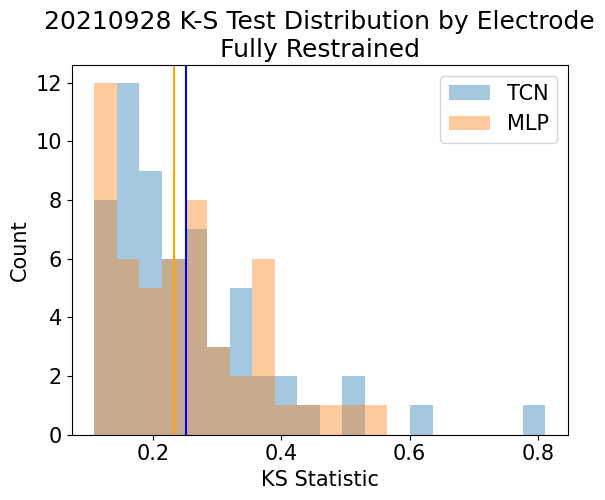

/content/drive/MyDrive/Miller_Lab/FIU/custom_functions/visualization.py:346: RuntimeWarning: ks_2samp: Exact calculation unsuccessful. Switching to method=asymp.
  ks_1 = ks_2samp(test_targets_1[:,k], test_preds_1[:,k]).statistic


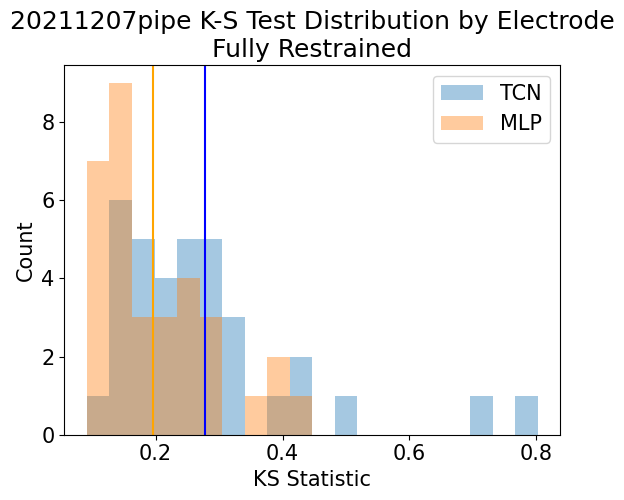

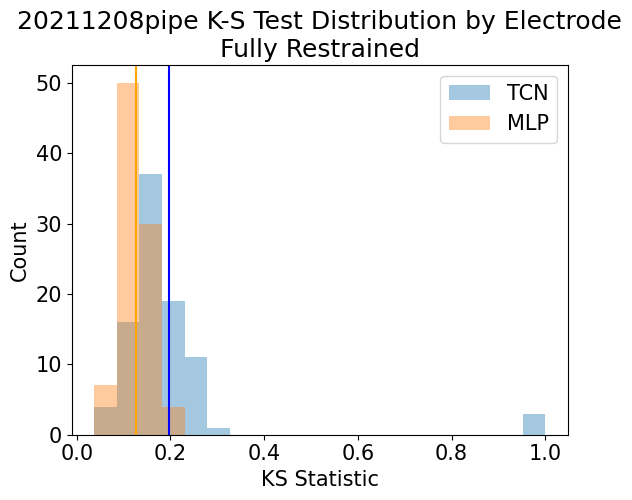

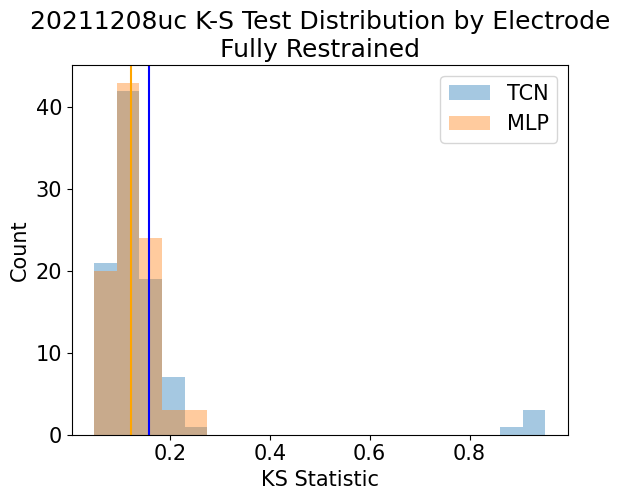

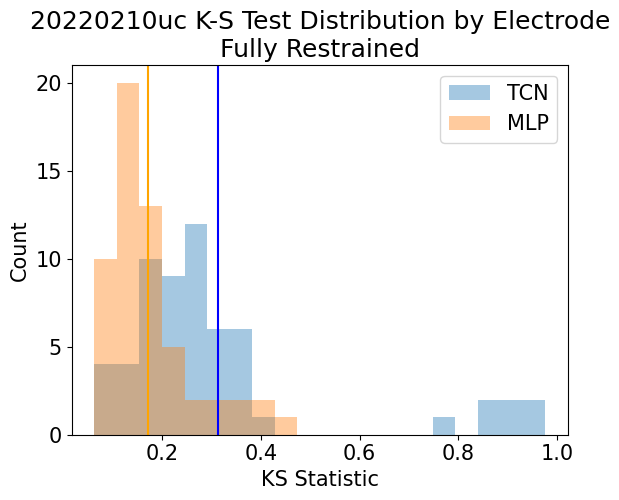

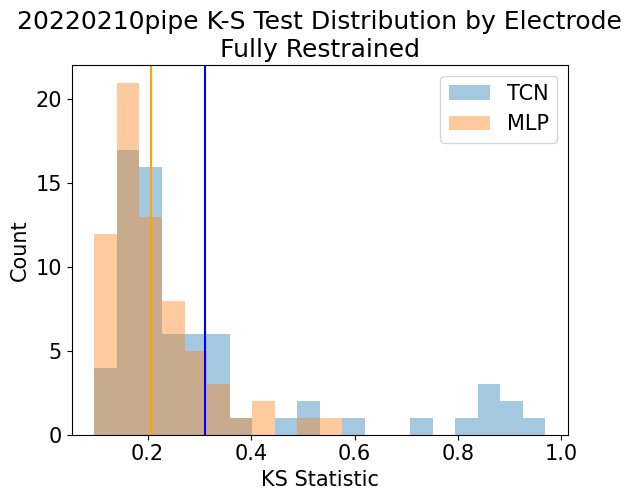

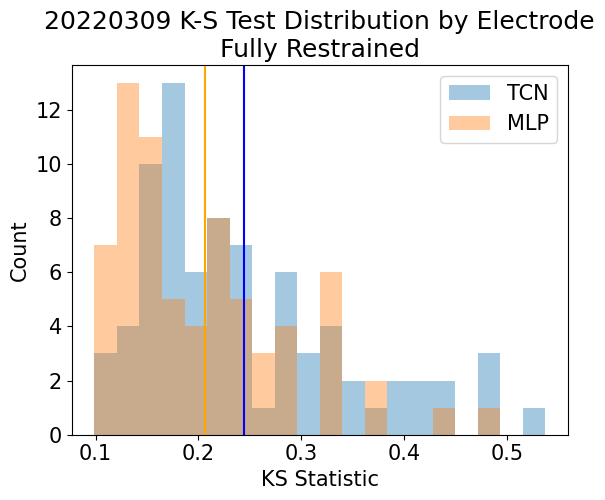

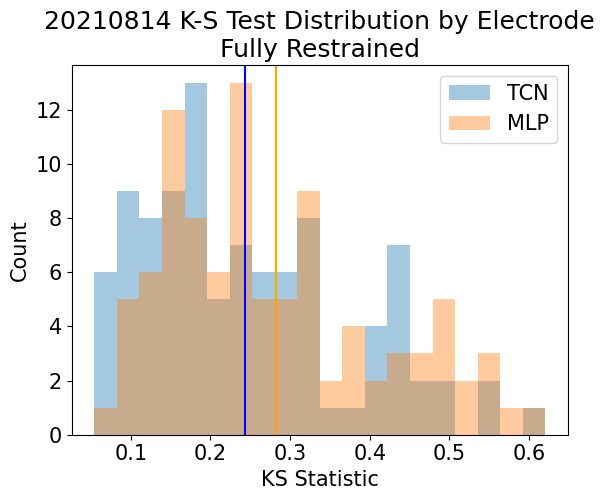

In [ ]:
for date in tcnn_dataset_dict_fr.keys():
    model_1_name = 'TCN'
    model1 = tcn_models_dict[date]
    dataset1 = tcnn_dataset_dict_fr[date]['Joint Angles']['Full']
    test_loader1 = tcnn_loader_dict_fr[date]['Joint Angles']['Test']
    conv1 = True
    model_2_name = 'MLP'
    model2 = mlp_models_dict[date]
    dataset2 = dataset_dict_fr[date]['Joint Angles']['Full']
    test_loader2 = loader_dict_fr[date]['Joint Angles']['Test']
    conv2 = False
    restraint_type = 'Fully Restrained'
    visualization.plot_and_compare_ks(model_1_name, model1, dataset1, test_loader1, conv1, 
                                  model_2_name, model2, dataset2, test_loader2, conv2, 
                                  restraint_type, bins = 20, exclude_bad_neurons = True)

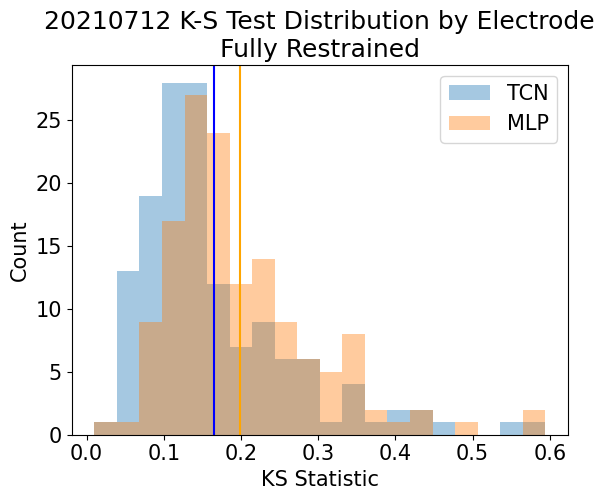

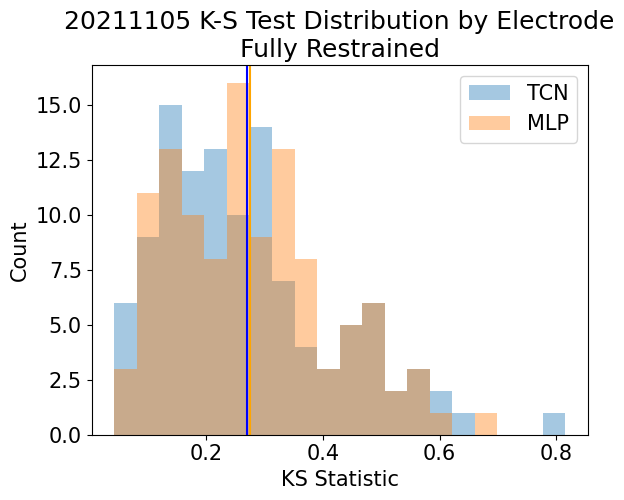

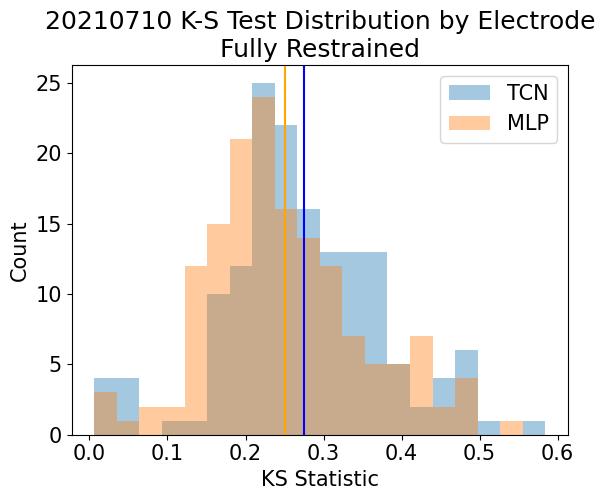

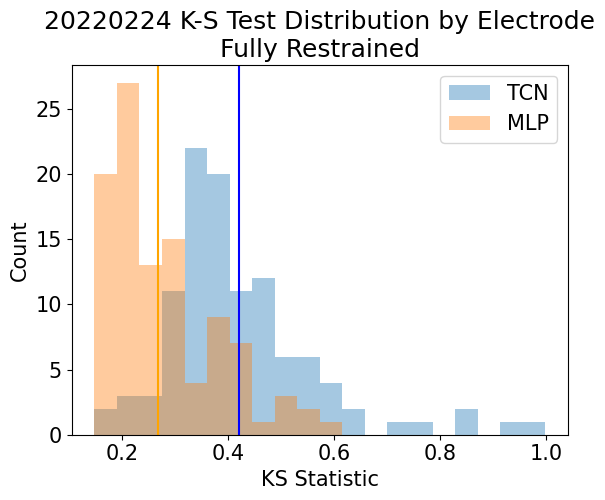

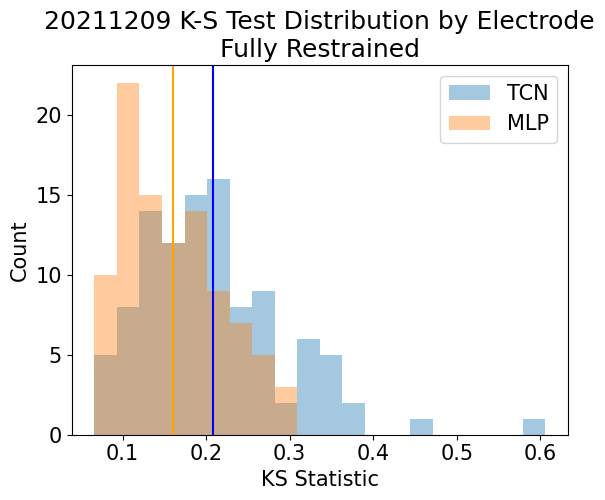

...

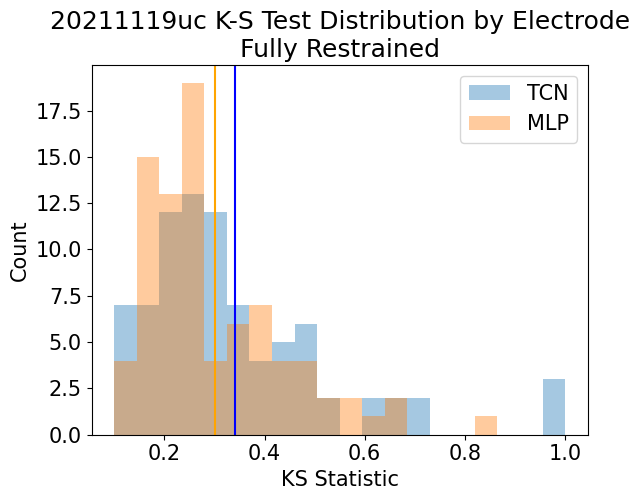

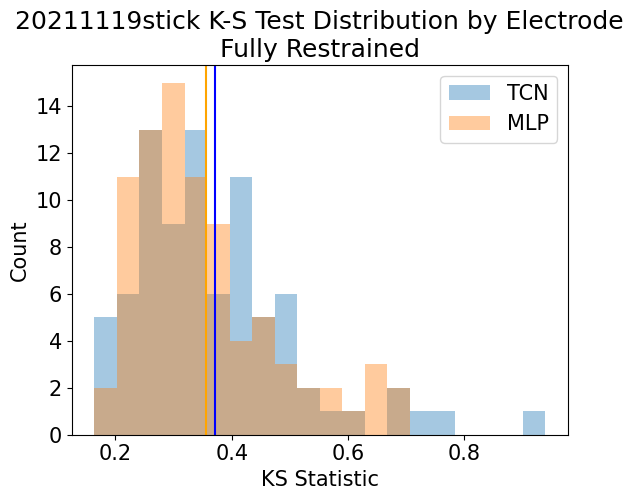

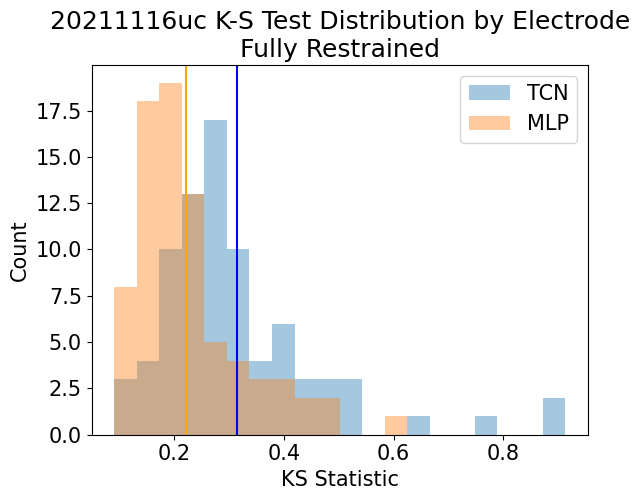

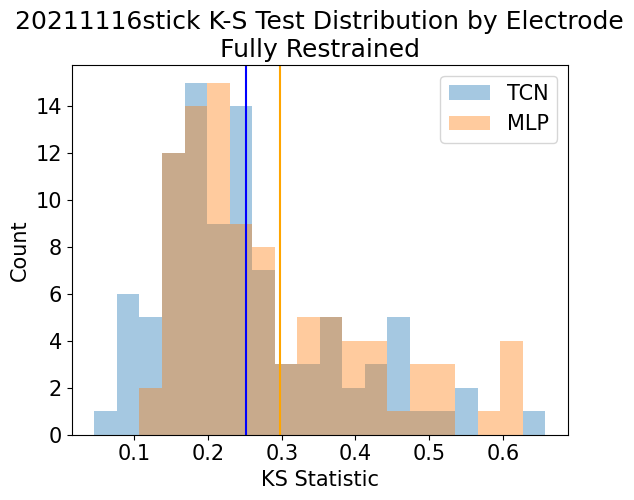

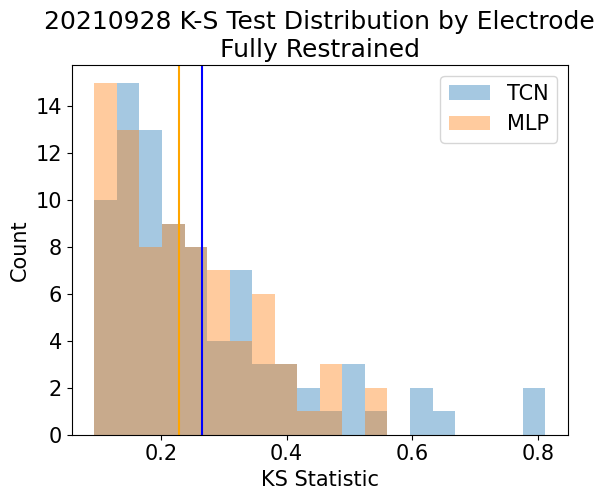

/content/drive/MyDrive/Miller_Lab/FIU/custom_functions/visualization.py:346: RuntimeWarning: ks_2samp: Exact calculation unsuccessful. Switching to method=asymp.
  ks_1 = ks_2samp(test_targets_1[:,k], test_preds_1[:,k]).statistic


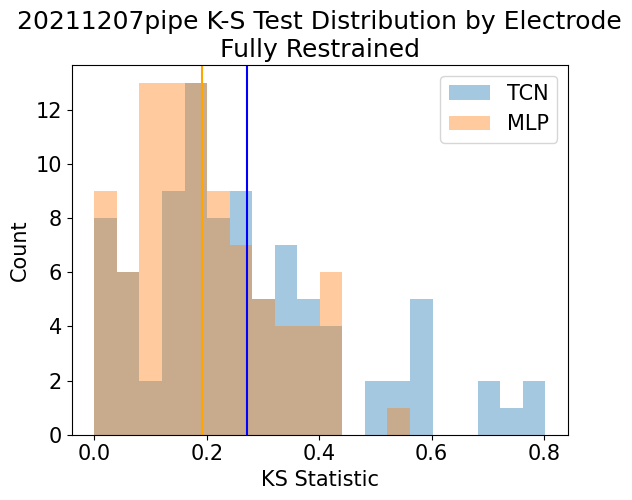

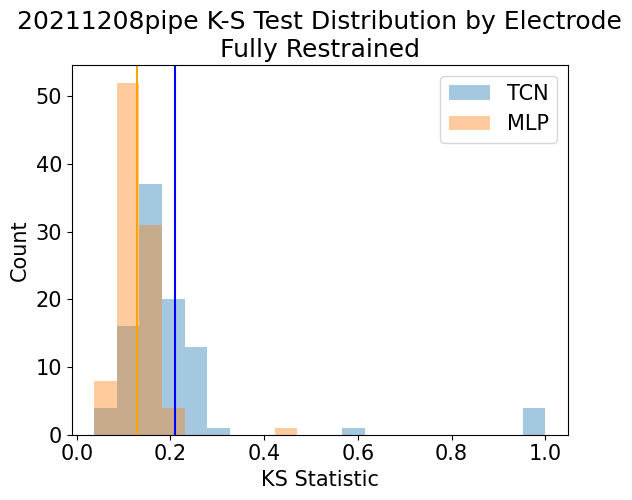

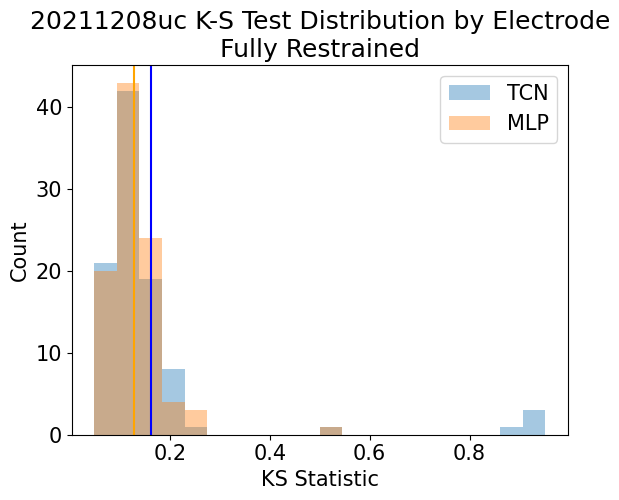

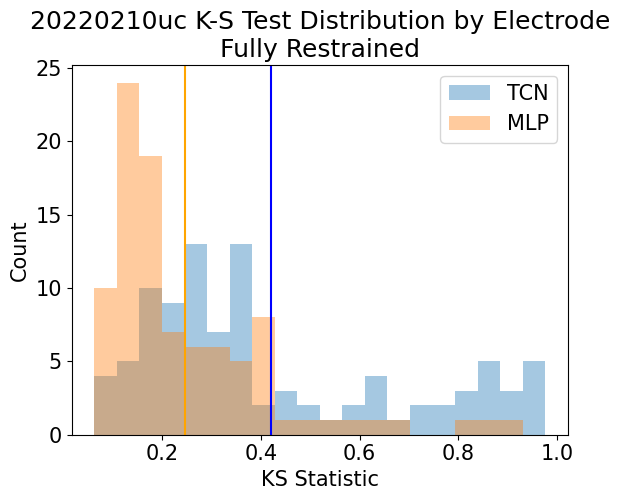

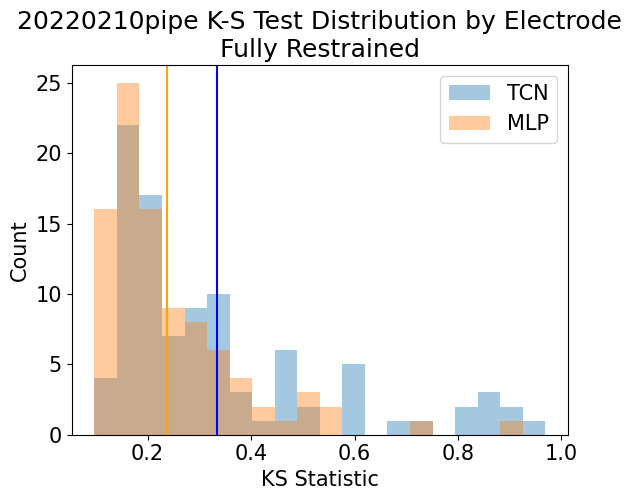

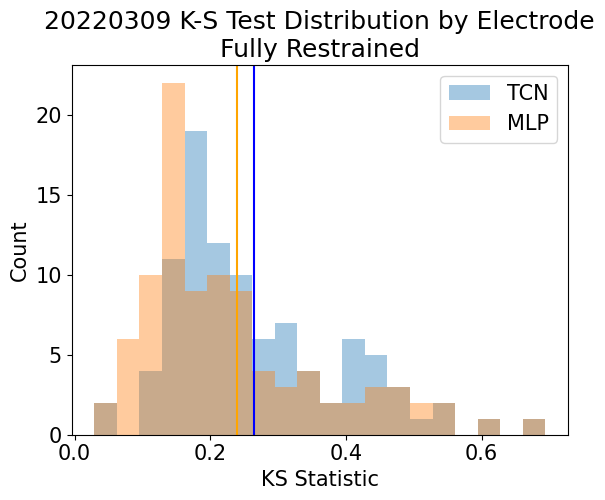

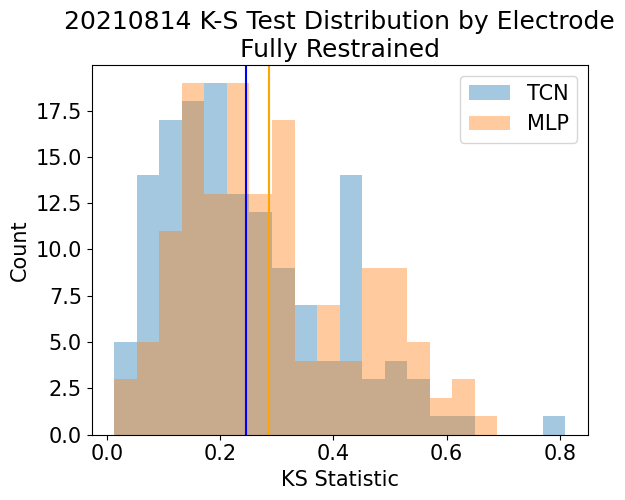

In [ ]:
for date in tcnn_dataset_dict_fr.keys():
    model_1_name = 'TCN'
    model1 = tcn_models_dict[date]
    dataset1 = tcnn_dataset_dict_fr[date]['Joint Angles']['Full']
    test_loader1 = tcnn_loader_dict_fr[date]['Joint Angles']['Test']
    conv1 = True
    model_2_name = 'MLP'
    model2 = mlp_models_dict[date]
    dataset2 = dataset_dict_fr[date]['Joint Angles']['Full']
    test_loader2 = loader_dict_fr[date]['Joint Angles']['Test']
    conv2 = False
    restraint_type = 'Fully Restrained'
    visualization.plot_and_compare_ks(model_1_name, model1, dataset1, test_loader1, conv1, 
                                  model_2_name, model2, dataset2, test_loader2, conv2, 
                                  restraint_type, bins = 20)

In [ ]:
shapes_dict = {
'20220309': (12,8),
'20210712': (14,10),
'20211105': (11,10),
'20210814': (14,10),
'20210710': (15,10),
'20220224': (12,9),
'20211209': (13,8),
'20211207uc': (10,8),
'20211206uc': (11,9),
'20211206pipe': (10,7),
'20211203': (5,5),
'20211119uc': (12,7),
'20211119stick': (10,8),
'20211116uc': (10,8),
'20211116stick': (10,9),
'20210928': (12,7),
'20211209': (10,10),
'20211208pipe': (12,8),
'20211208uc': (12,8),
'20211207pipe': (10,9),
'20220210uc': (12,8),
'20220210pipe': (12,8)}

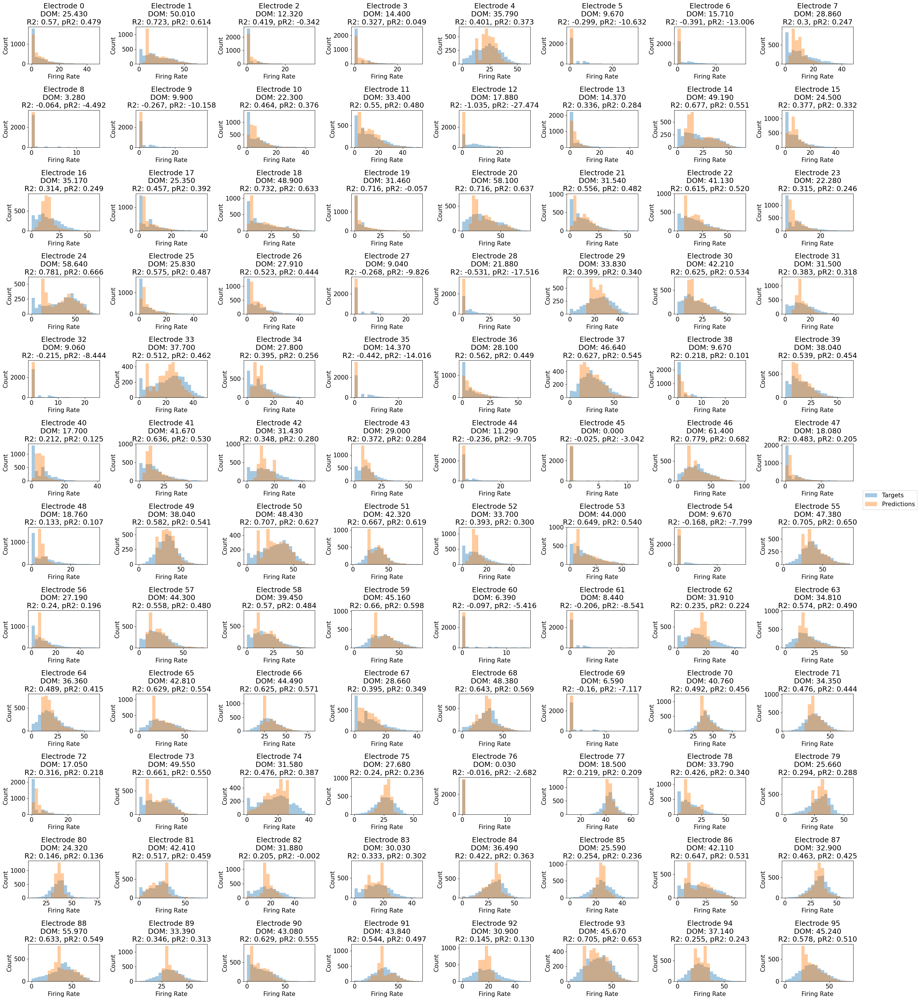

In [ ]:
for date in ['20220309']:
    nrows, ncols = shapes_dict[date]
    model = tcn_models_dict[date]
    dataset = tcnn_dataset_dict_fr[date]['Joint Angles']['Full']
    test_loader = tcnn_loader_dict_fr[date]['Joint Angles']['Test']
    test_target_dist_lst_tcn, test_pred_dist_lst_tcn = visualization.plot_distributions(model,dataset,test_loader,conv=True, nrows = nrows, ncols=ncols)

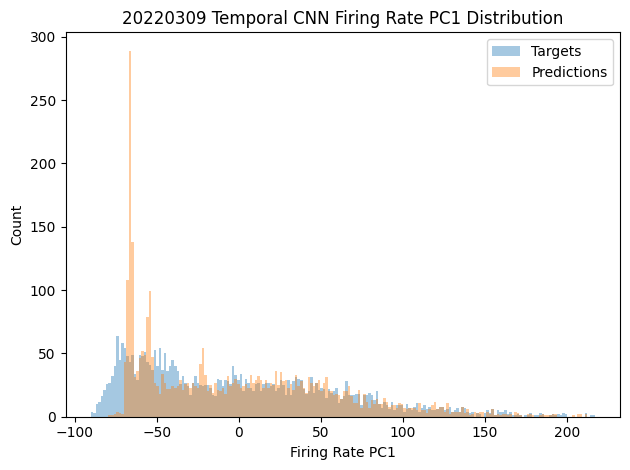

In [ ]:
for date in ['20220309']:
    model = tcn_models_dict[date]
    dataset = tcnn_dataset_dict_fr[date]['Joint Angles']['Full']
    test_loader = tcnn_loader_dict_fr[date]['Joint Angles']['Test']
    visualization.plot_pc1_distribution(model,dataset,test_loader,conv=True)

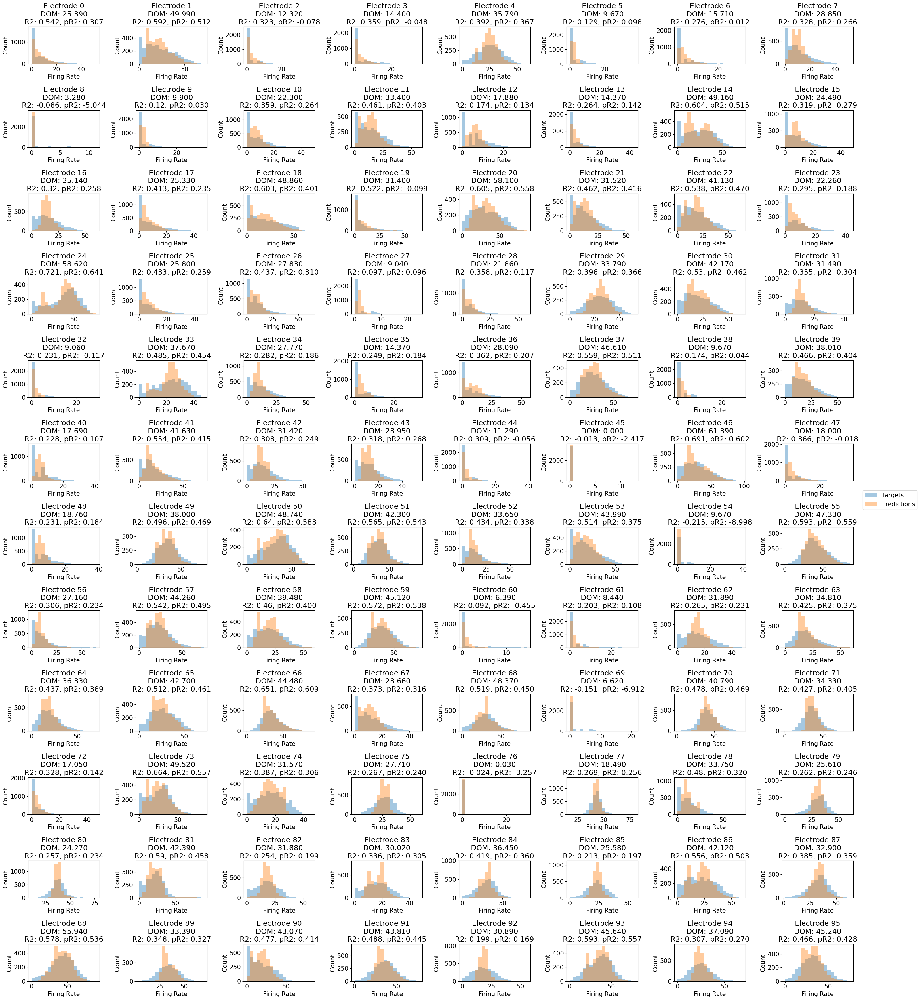

In [ ]:
for date in ['20220309']:
    nrows, ncols = shapes_dict[date]
    model = mlp_models_dict[date]
    dataset = dataset_dict_fr[date]['Joint Angles']['Full']
    test_loader = loader_dict_fr[date]['Joint Angles']['Test']
    test_target_dist_lst_tcn, test_pred_dist_lst_tcn = visualization.plot_distributions(model,dataset,test_loader,conv=False, nrows = nrows, ncols=ncols)

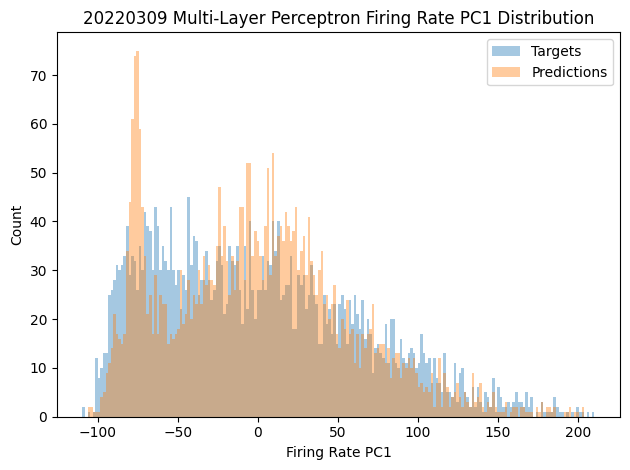

In [ ]:
for date in ['20220309']:
    model = mlp_models_dict[date]
    dataset = dataset_dict_fr[date]['Joint Angles']['Full']
    test_loader = loader_dict_fr[date]['Joint Angles']['Test']
    visualization.plot_pc1_distribution(model,dataset,test_loader,conv=False)

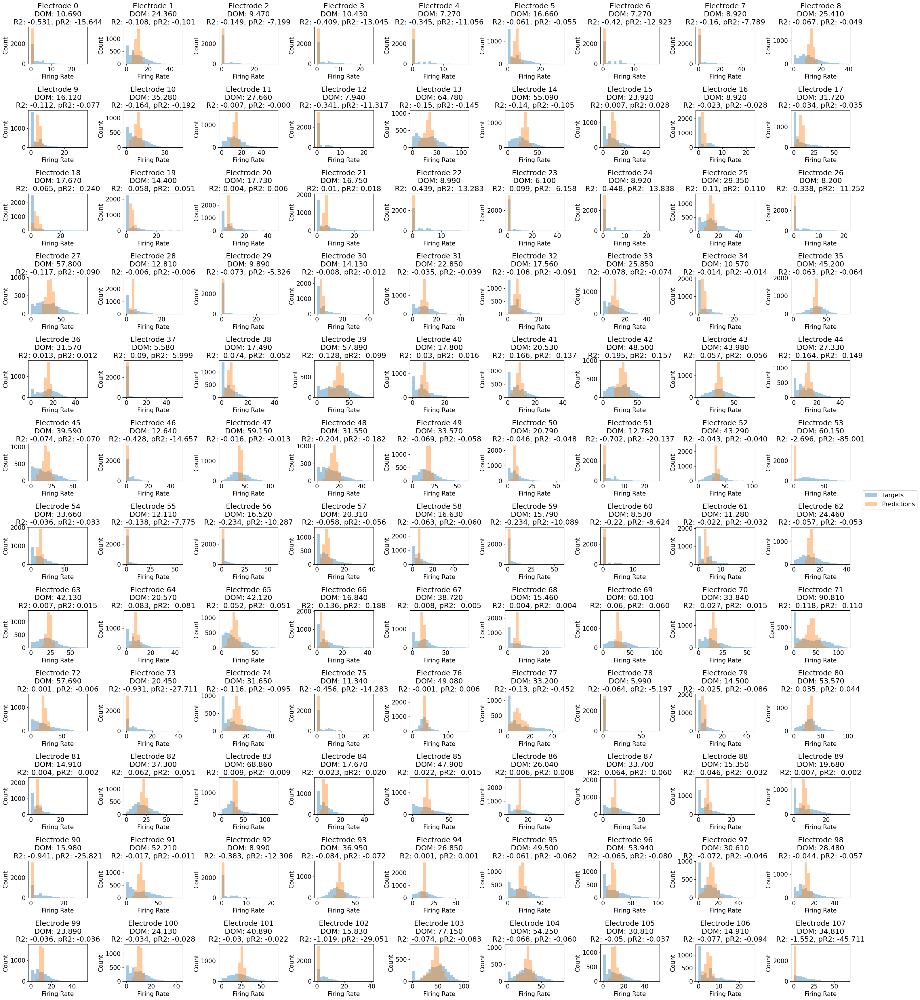

In [ ]:
for date in ['20220224']:
    nrows, ncols = shapes_dict[date]
    model = tcn_models_dict[date]
    dataset = tcnn_dataset_dict_fr[date]['Joint Angles']['Full']
    test_loader = tcnn_loader_dict_fr[date]['Joint Angles']['Test']
    test_target_dist_lst_tcn, test_pred_dist_lst_tcn = visualization.plot_distributions(model,dataset,test_loader,conv=True, nrows = nrows, ncols=ncols)

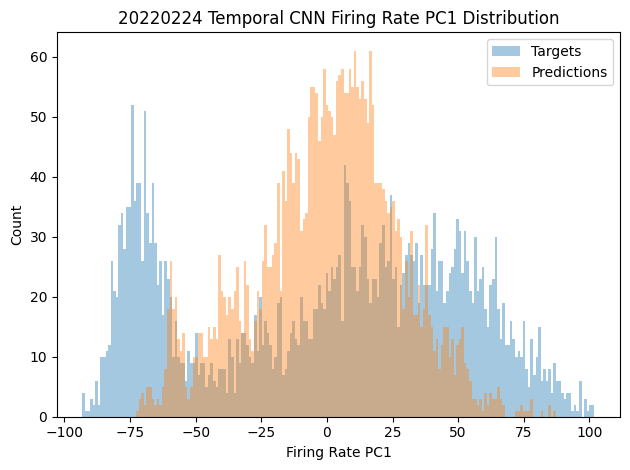

In [ ]:
for date in ['20220224']:
    model = tcn_models_dict[date]
    dataset = tcnn_dataset_dict_fr[date]['Joint Angles']['Full']
    test_loader = tcnn_loader_dict_fr[date]['Joint Angles']['Test']
    visualization.plot_pc1_distribution(model,dataset,test_loader,conv=True)

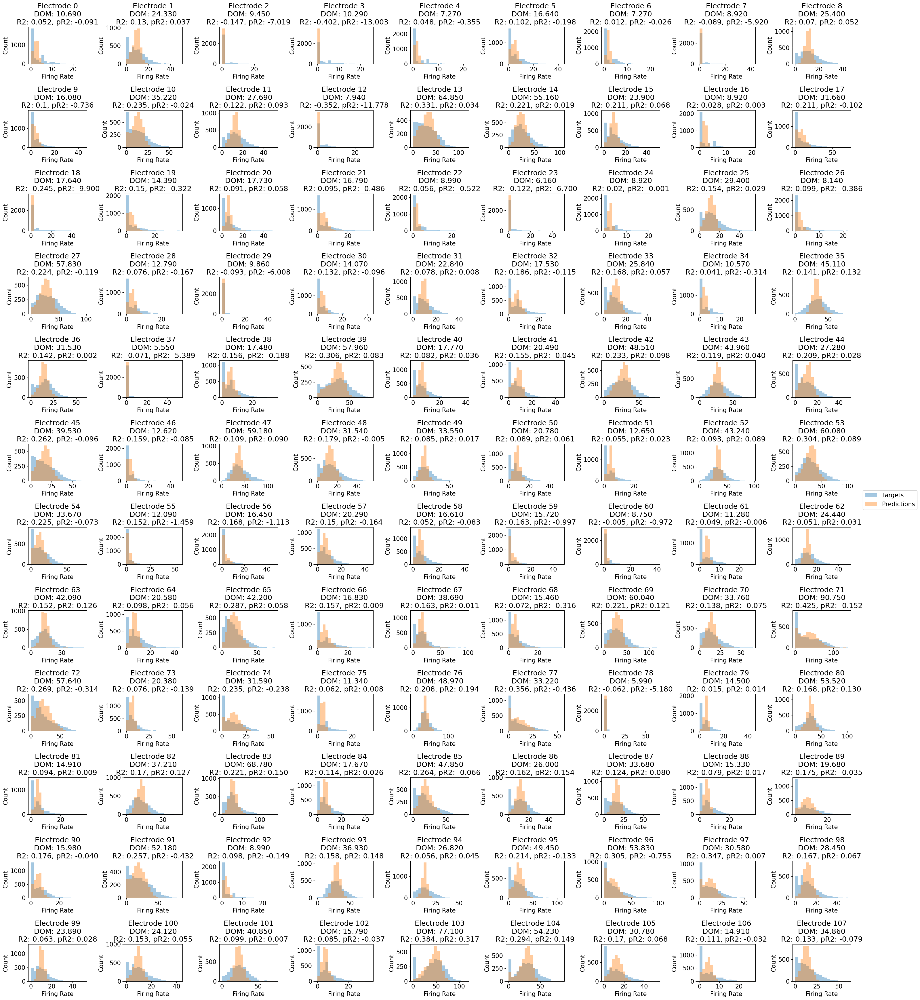

In [ ]:
for date in ['20220224']:
    nrows, ncols = shapes_dict[date]
    model = mlp_models_dict[date]
    dataset = dataset_dict_fr[date]['Joint Angles']['Full']
    test_loader = loader_dict_fr[date]['Joint Angles']['Test']
    test_target_dist_lst_tcn, test_pred_dist_lst_tcn = visualization.plot_distributions(model,dataset,test_loader,conv=False, nrows = nrows, ncols=ncols)

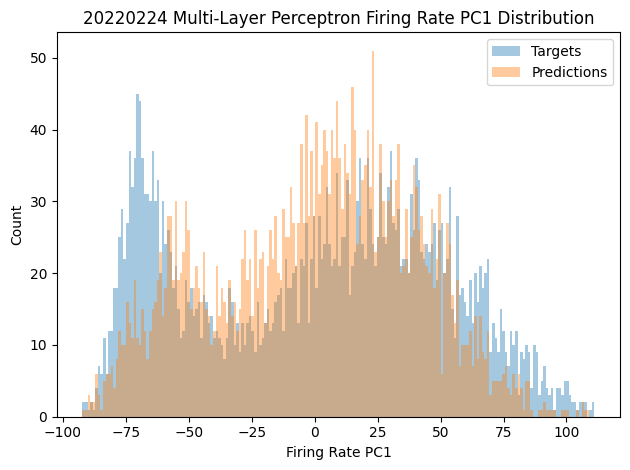

In [ ]:
for date in ['20220224']:
    model = mlp_models_dict[date]
    dataset = dataset_dict_fr[date]['Joint Angles']['Full']
    test_loader = loader_dict_fr[date]['Joint Angles']['Test']
    visualization.plot_pc1_distribution(model,dataset,test_loader,conv=False)

# TCN Comparison: Standard vs TL

TCN average pR2: 0.2754470412045309
TCN TL average pR2: 0.0960984515817198


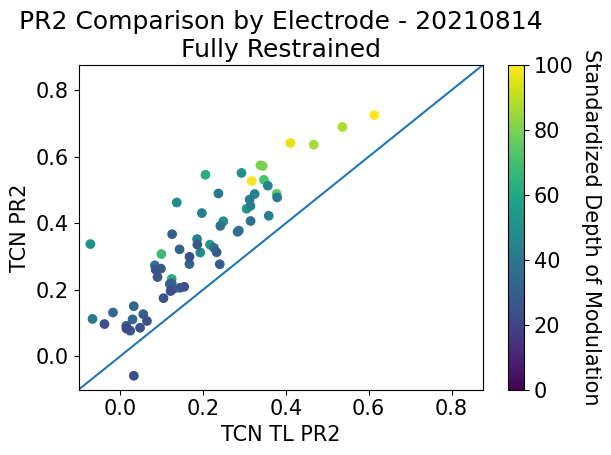

TCN average pR2: 0.3344889498419232
TCN TL average pR2: 0.20647985488176346


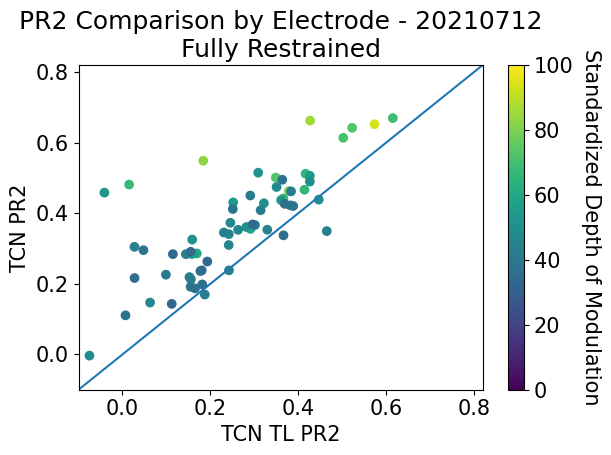

TCN average pR2: 0.14449378499737034
TCN TL average pR2: 0.07972835255907727


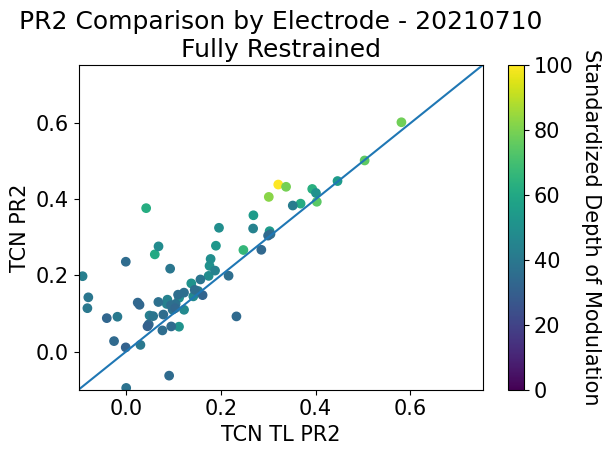

TCN average pR2: -0.2704790511796641
TCN TL average pR2: -0.0842179212459298


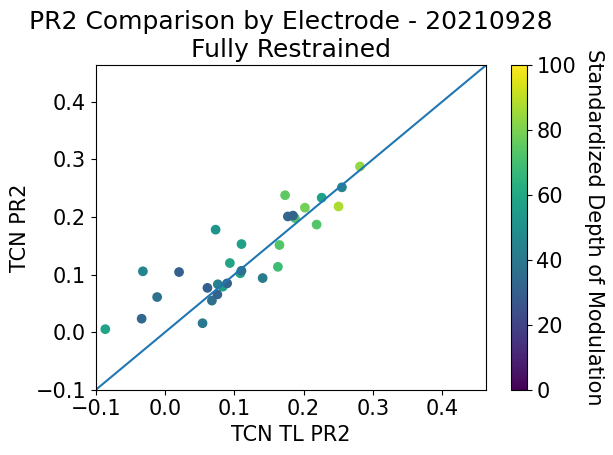

TCN average pR2: 0.08022810597168772
TCN TL average pR2: -0.013919029319495485


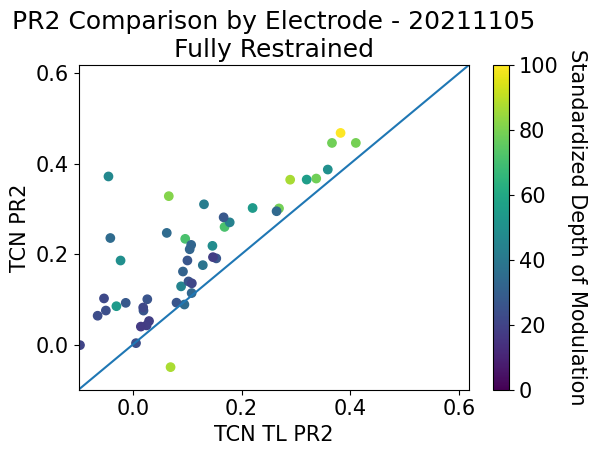

TCN average pR2: -0.5514046394306681
TCN TL average pR2: -0.6391964969427689


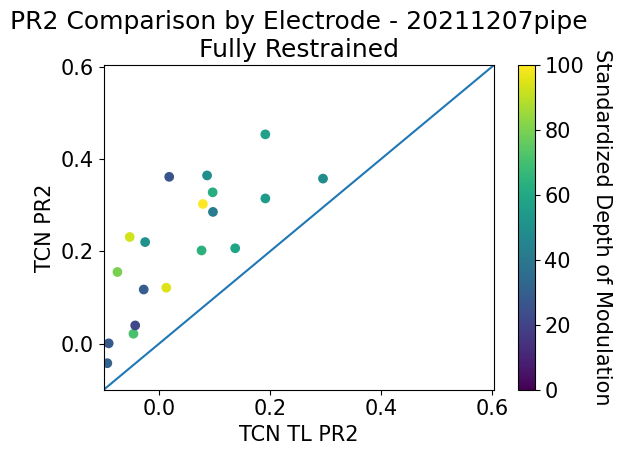

TCN average pR2: -0.10104588525635856
TCN TL average pR2: -0.2720726543948764


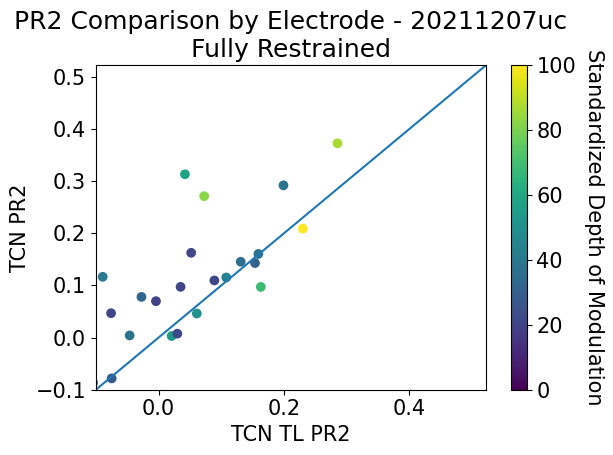

TCN average pR2: 0.1687239498462317
TCN TL average pR2: -0.03164935899230669


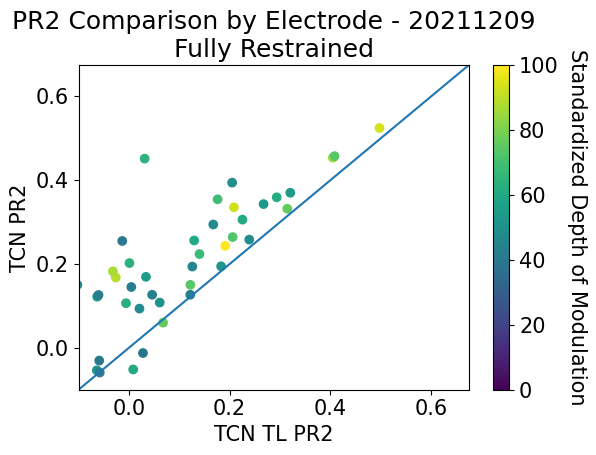

TCN average pR2: 0.35947806859502984
TCN TL average pR2: 0.2933034896850586


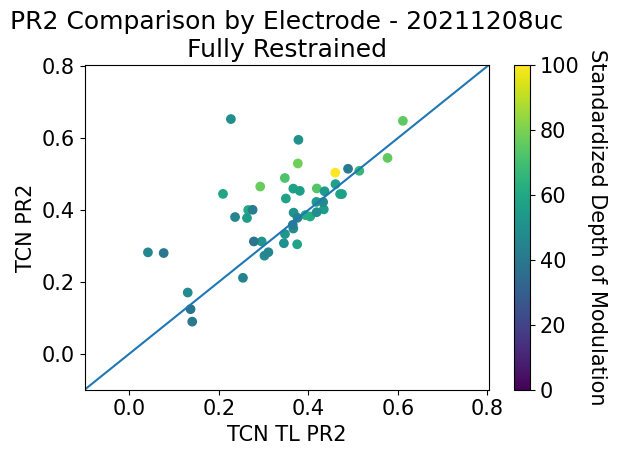

TCN average pR2: -0.4379071921718364
TCN TL average pR2: -0.2741474448418131


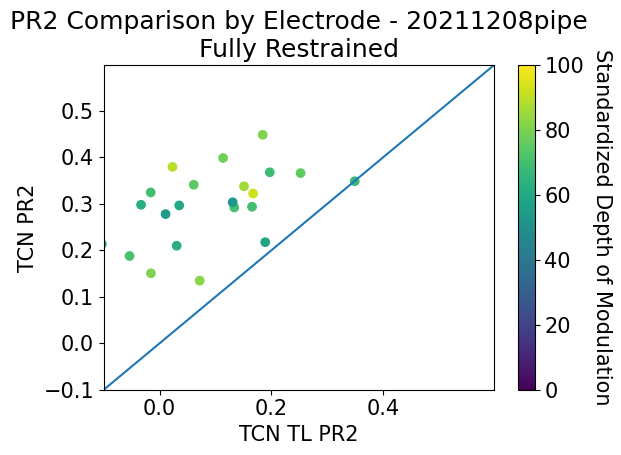

TCN average pR2: -0.9244430600380411
TCN TL average pR2: 0.17565604618617467


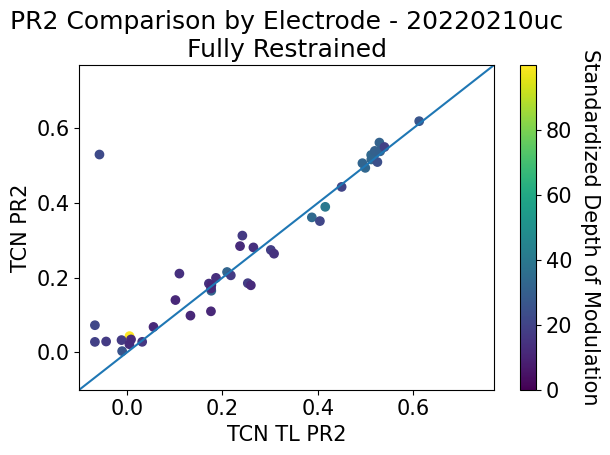

TCN average pR2: 0.2735960301087827
TCN TL average pR2: 0.2728471026128652


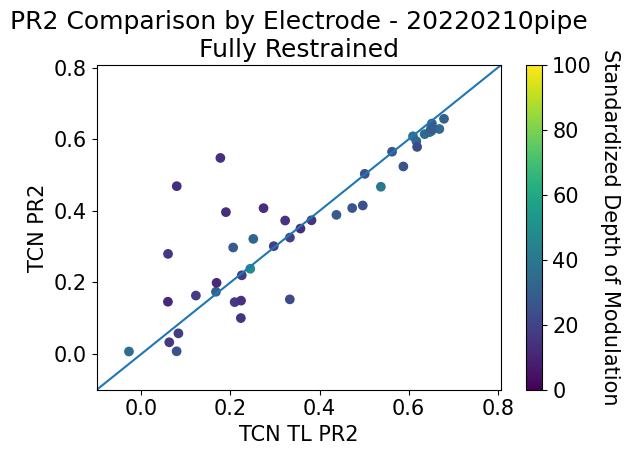

TCN average pR2: 0.3450016488834303
TCN TL average pR2: 0.24358415603637695


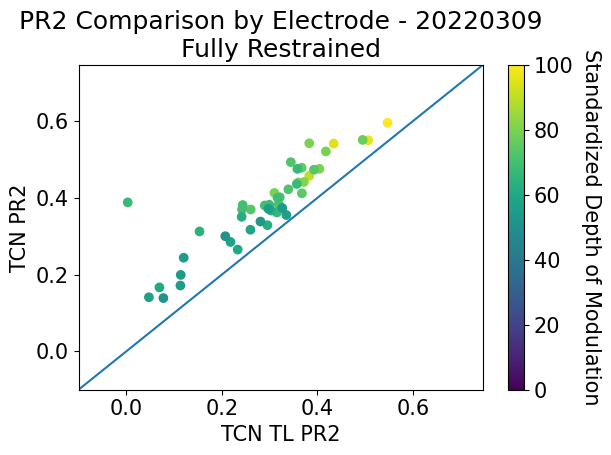

TCN average pR2: -2.453800262104381
TCN TL average pR2: -0.36558920470151035


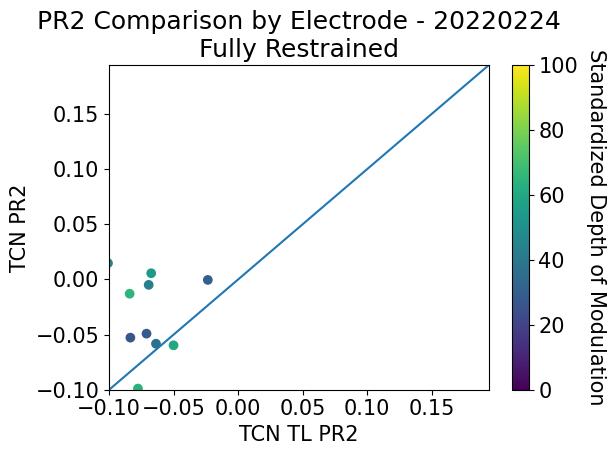

In [ ]:
for date in tcn_tl_models_dict.keys():
    model_1_name = 'TCN'
    model1 = tcn_models_dict[date]
    dataset1 = tcnn_dataset_dict_fr[date]['Joint Angles']['Full']
    test_loader1 = tcnn_loader_dict_fr[date]['Joint Angles']['Test']
    conv1 = True
    model_2_name = 'TCN TL'
    model2 = tcn_tl_models_dict[date]
    dataset2 = tcnn_dataset_dict_fr[date]['Joint Angles']['Full']
    test_loader2 = tcnn_loader_dict_fr[date]['Joint Angles']['Test']
    conv2 = True
    restraint_type = 'Fully Restrained'
    visualization.compare_pr2_plots(model_1_name, model1, dataset1, test_loader1, conv1, 
                                model_2_name, model2, dataset2, test_loader2, conv2, 
                                restraint_type, exclude_bad_neurons = True)

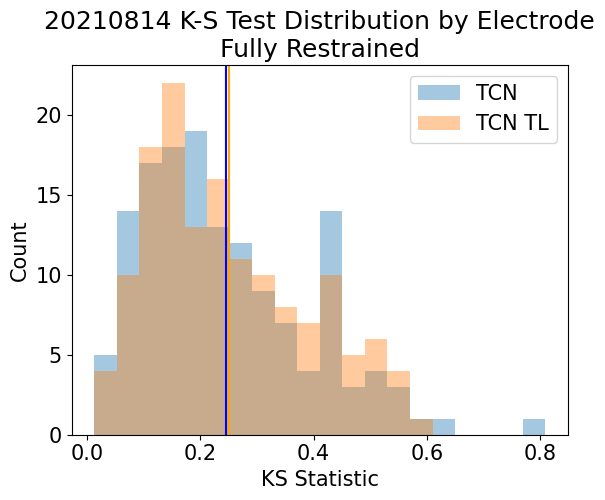

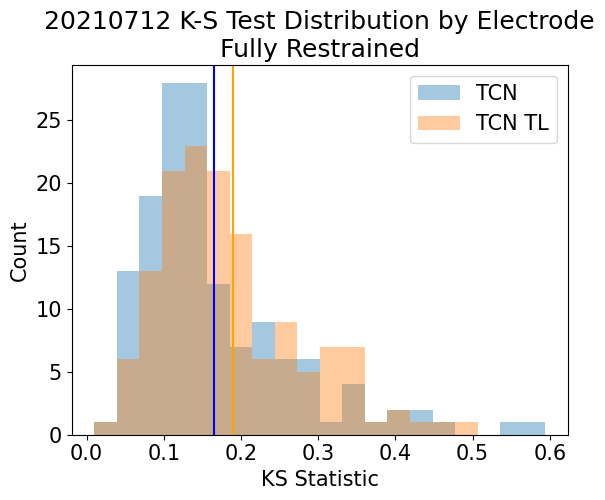

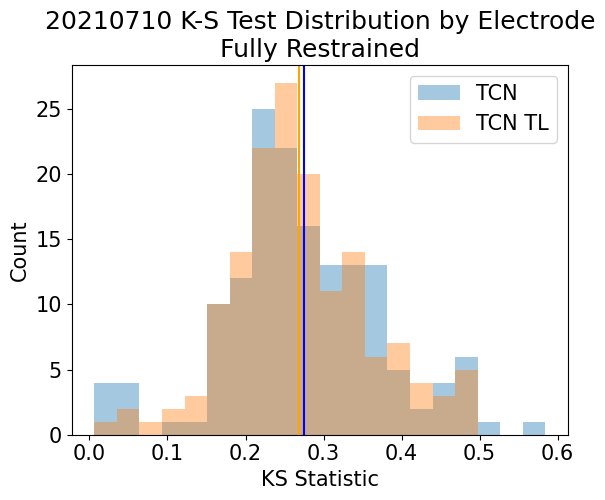

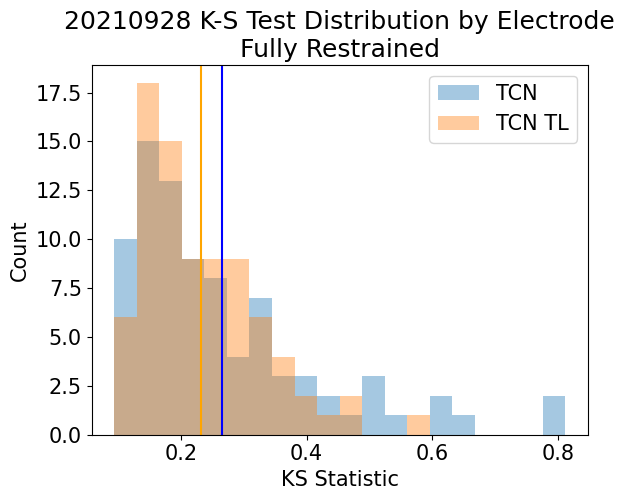

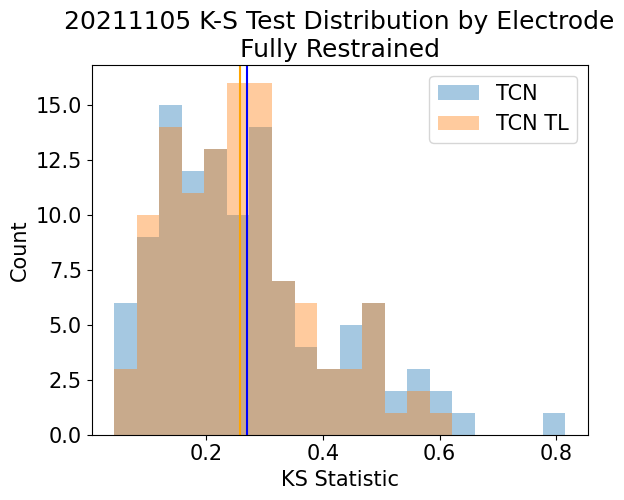

/content/drive/MyDrive/Miller_Lab/FIU/custom_functions/visualization.py:346: RuntimeWarning: ks_2samp: Exact calculation unsuccessful. Switching to method=asymp.
  
/content/drive/MyDrive/Miller_Lab/FIU/custom_functions/visualization.py:347: RuntimeWarning: ks_2samp: Exact calculation unsuccessful. Switching to method=asymp.
  Returns:


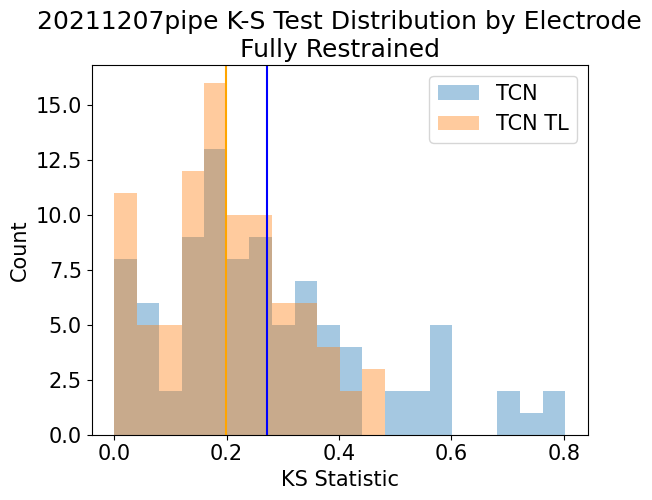

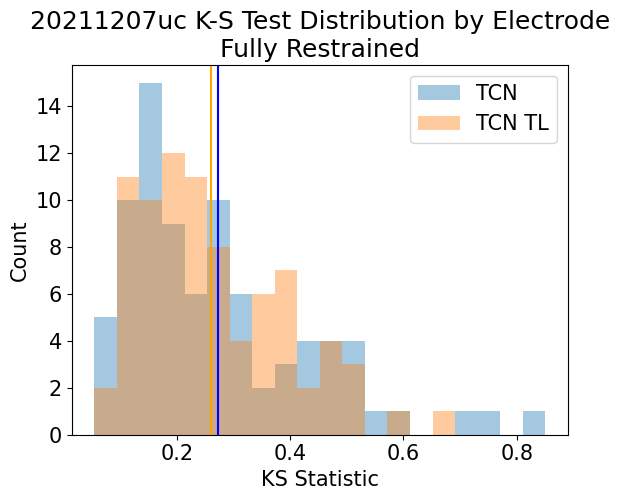

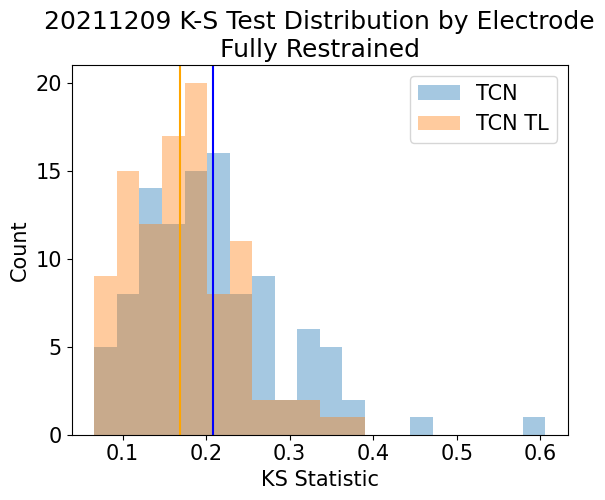

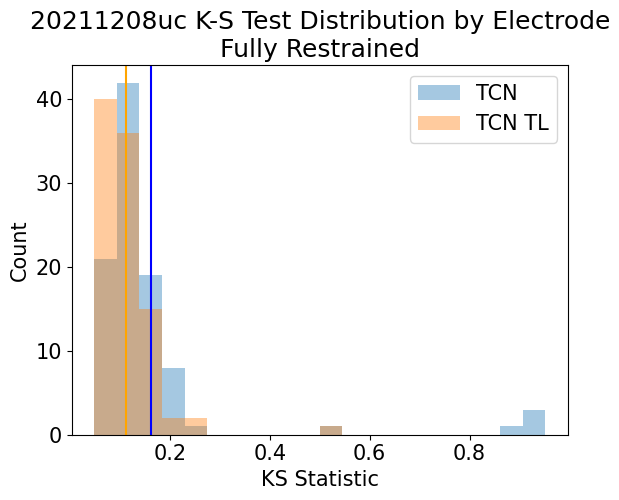

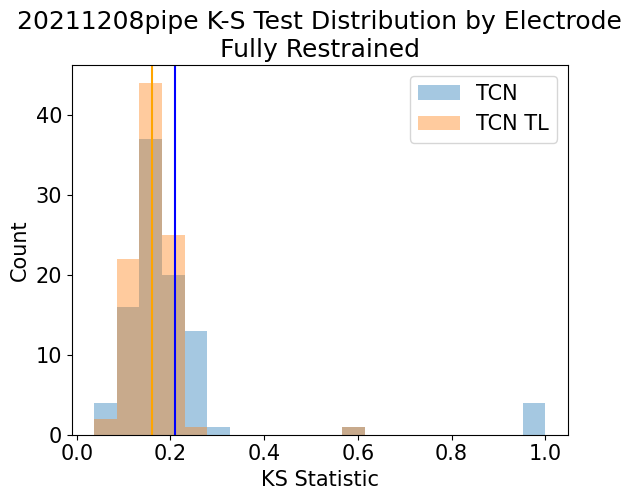

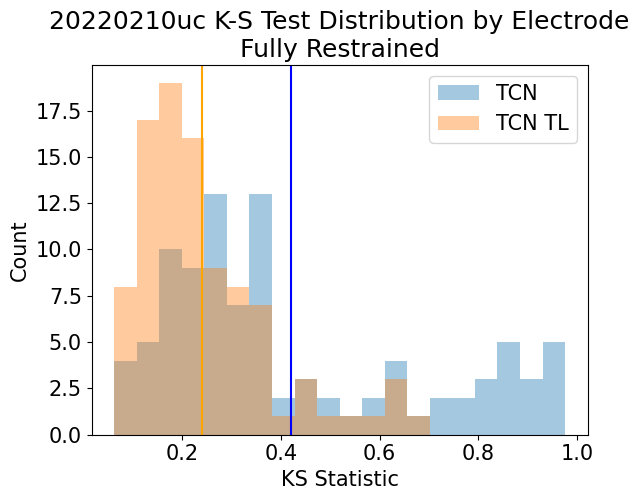

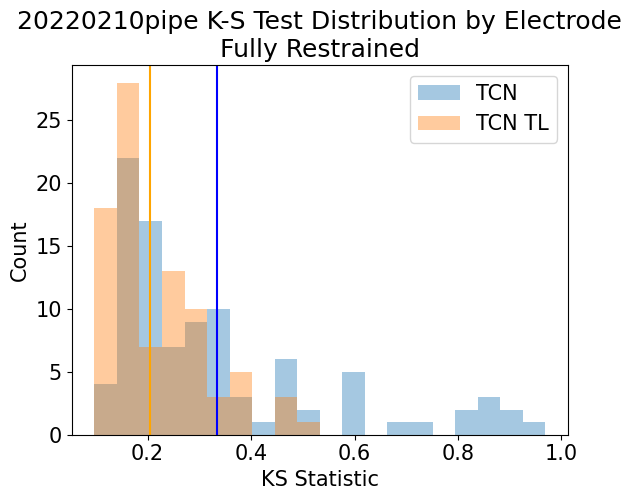

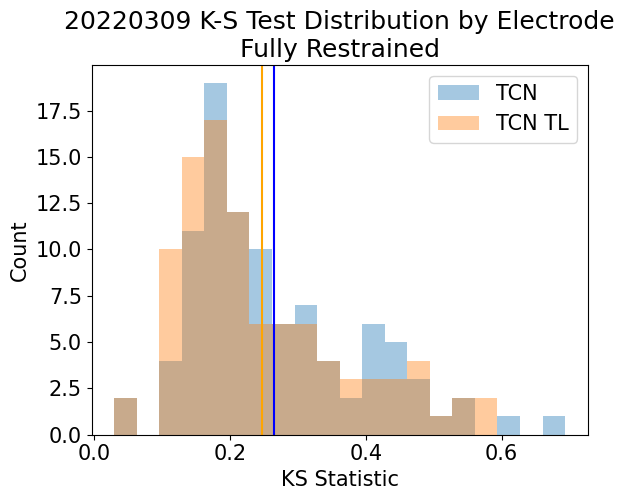

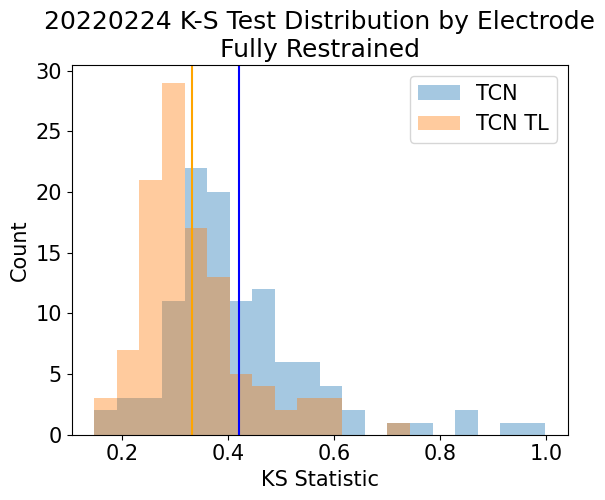

In [ ]:
for date in tcn_tl_models_dict.keys():
    model_1_name = 'TCN'
    model1 = tcn_models_dict[date]
    dataset1 = tcnn_dataset_dict_fr[date]['Joint Angles']['Full']
    test_loader1 = tcnn_loader_dict_fr[date]['Joint Angles']['Test']
    conv1 = True
    model_2_name = 'TCN TL'
    model2 = tcn_tl_models_dict[date]
    dataset2 = tcnn_dataset_dict_fr[date]['Joint Angles']['Full']
    test_loader2 = tcnn_loader_dict_fr[date]['Joint Angles']['Test']
    conv2 = True
    restraint_type = 'Fully Restrained'
    visualization.plot_and_compare_ks(model_1_name, model1, dataset1, test_loader1, conv1, 
                                  model_2_name, model2, dataset2, test_loader2, conv2, 
                                  restraint_type, bins = 20, exclude_bad_neurons = False)

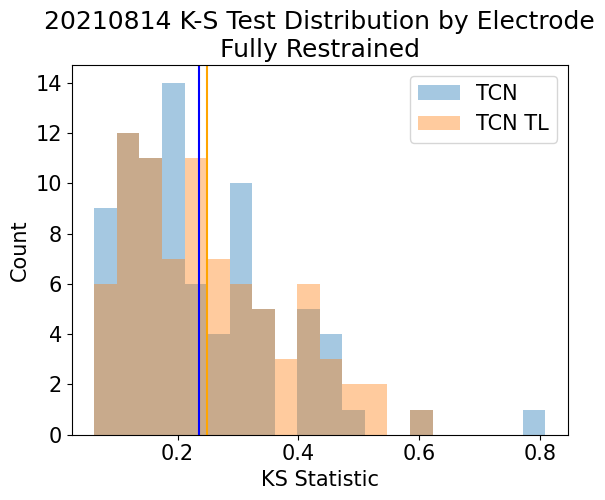

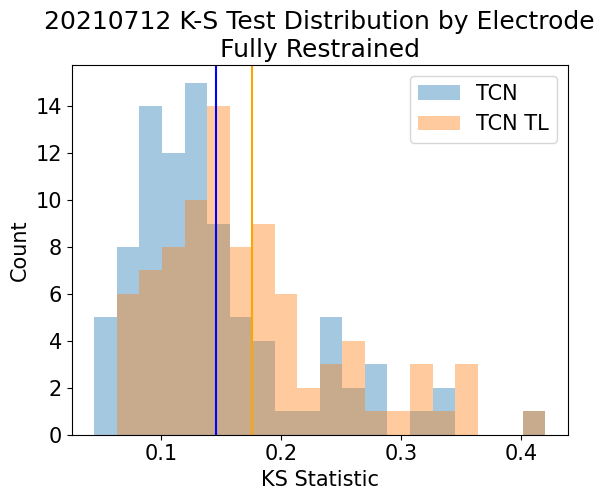

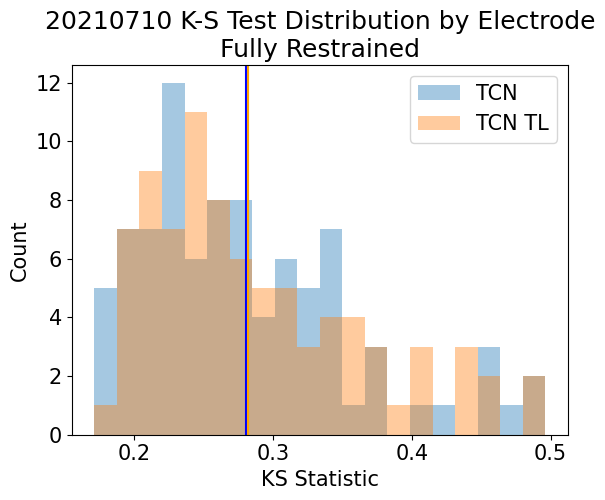

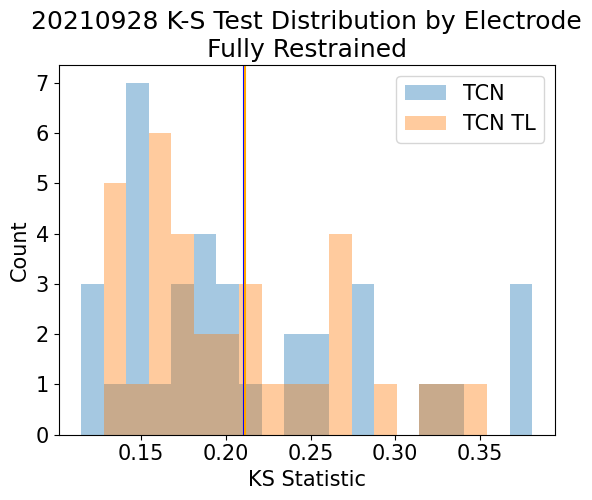

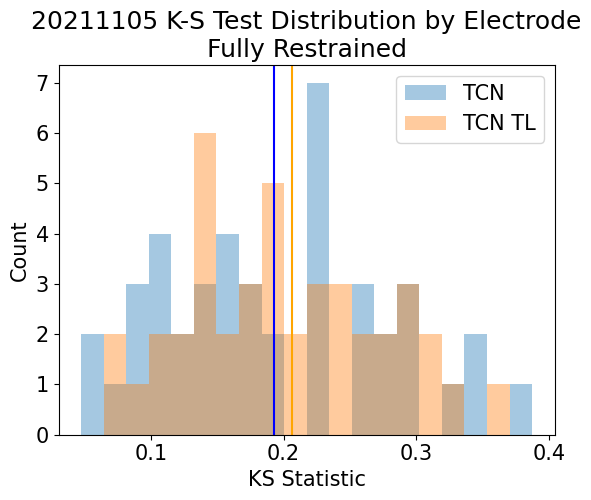

/content/drive/MyDrive/Miller_Lab/FIU/custom_functions/visualization.py:346: RuntimeWarning: ks_2samp: Exact calculation unsuccessful. Switching to method=asymp.
  
/content/drive/MyDrive/Miller_Lab/FIU/custom_functions/visualization.py:347: RuntimeWarning: ks_2samp: Exact calculation unsuccessful. Switching to method=asymp.
  Returns:


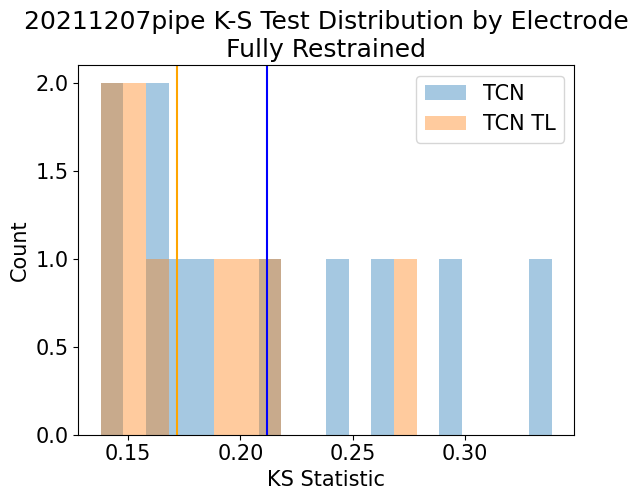

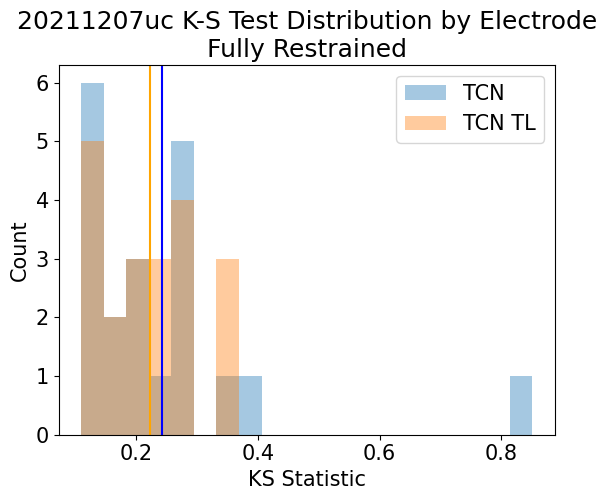

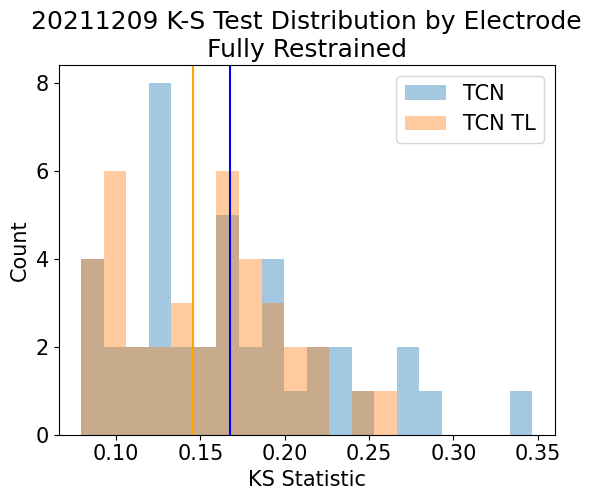

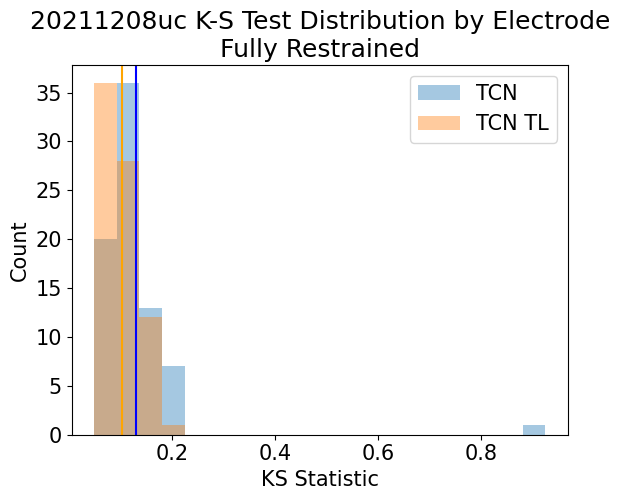

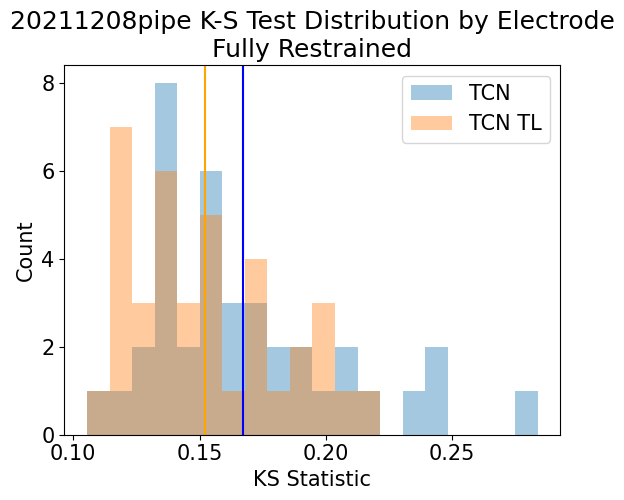

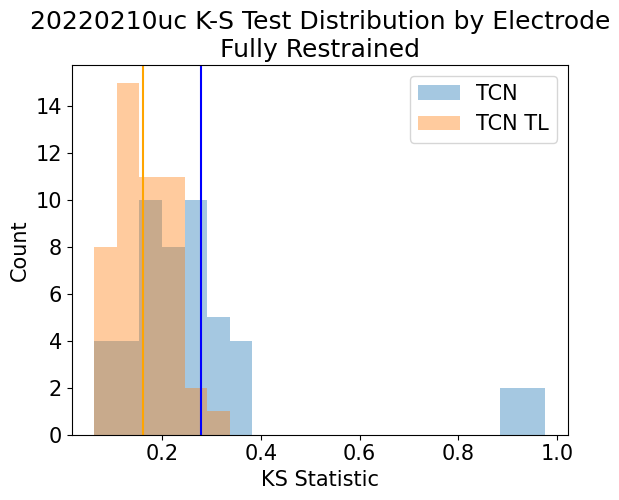

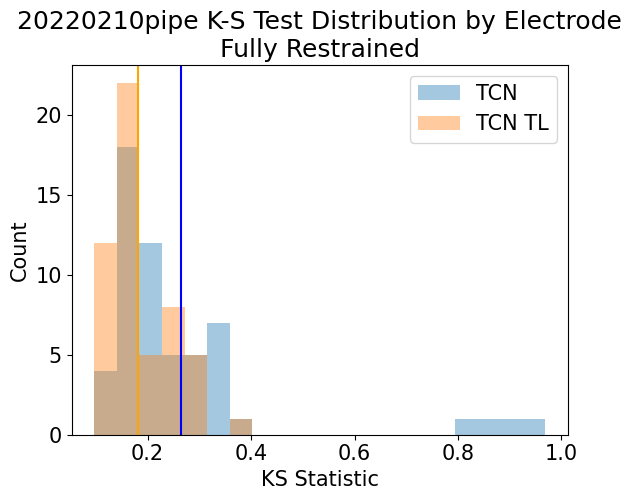

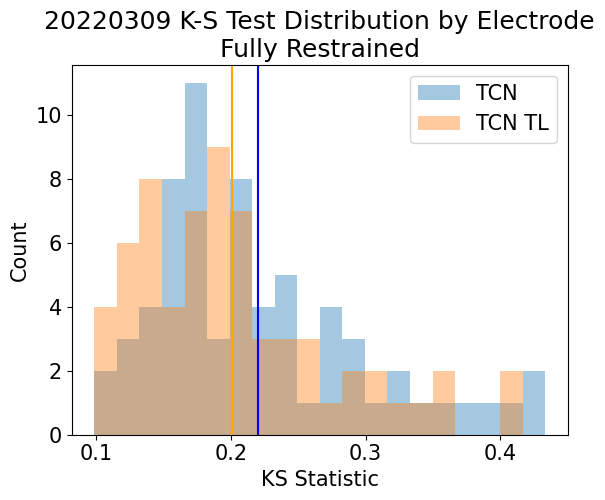

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


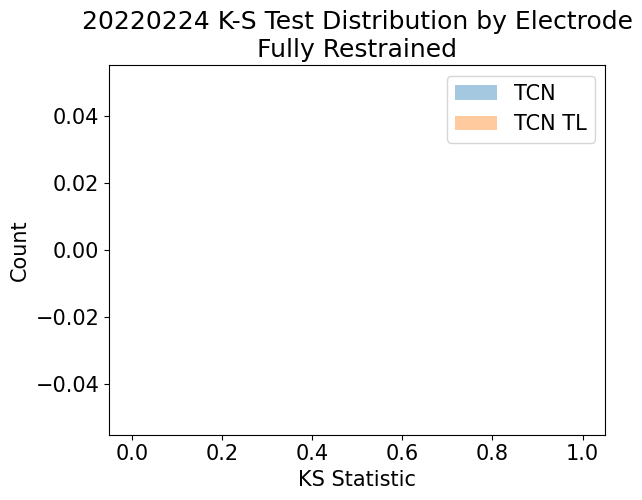

In [ ]:
for date in tcn_tl_models_dict.keys():
    model_1_name = 'TCN'
    model1 = tcn_models_dict[date]
    dataset1 = tcnn_dataset_dict_fr[date]['Joint Angles']['Full']
    test_loader1 = tcnn_loader_dict_fr[date]['Joint Angles']['Test']
    conv1 = True
    model_2_name = 'TCN TL'
    model2 = tcn_tl_models_dict[date]
    dataset2 = tcnn_dataset_dict_fr[date]['Joint Angles']['Full']
    test_loader2 = tcnn_loader_dict_fr[date]['Joint Angles']['Test']
    conv2 = True
    restraint_type = 'Fully Restrained'
    visualization.plot_and_compare_ks(model_1_name, model1, dataset1, test_loader1, conv1, 
                                  model_2_name, model2, dataset2, test_loader2, conv2, 
                                  restraint_type, bins = 20, exclude_bad_neurons = True)

TypeError: ignored

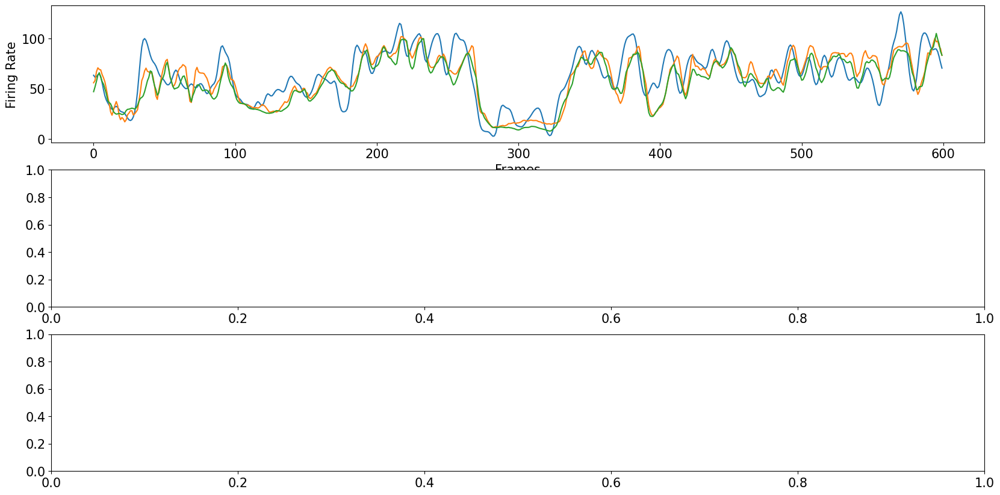

In [32]:
for date in tcn_tl_models_dict.keys():
    dataset = tcnn_dataset_dict_fr[date]['Joint Angles']['Full']
    tcn_tl_model = tcn_tl_models_dict[date]
    tcn_model = tcn_models_dict[date]
    tcn_good_range_arrays = tcnn_dataset_dict_fr[date]['Joint Angles']['GoodRange']

    dataset_array_output = data_loading.convert_osim_dataset_to_array(dataset)
    top_3_electrodes = visualization.depth_of_modulation(dataset_array_output[1], return_top_n = 3)[1]

    visualization.plot_compare_electrodes_subset_tl(date, tcn_tl_model, tcn_model, tcn_good_range_arrays, top_3_electrodes)

In [ ]:
# dataset_20220309 = tcnn_dataset_dict_fr['20220309']['Joint Angles']['Full']
# loader_20220309 = tcnn_loader_dict_fr['20220309']['Joint Angles']['Test']
# model_20220309 = tcn_models_dict['20220309']

# dataset_20220224 = tcnn_dataset_dict_fr['20220224']['Joint Angles']['Full']
# loader_20220224 = tcnn_loader_dict_fr['20220224']['Joint Angles']['Test']
# model_20220224 = tcn_models_dict['20220224']

# conv = True

dataset_20220309 = dataset_dict_fr['20220309']['Joint Angles']['Full']
loader_20220309 = loader_dict_fr['20220309']['Joint Angles']['Test']
model_20220309 = mlp_models_dict['20220309']

dataset_20220224 = dataset_dict_fr['20220224']['Joint Angles']['Full']
loader_20220224 = loader_dict_fr['20220224']['Joint Angles']['Test']
model_20220224 = mlp_models_dict['20220224']

conv = False

In [ ]:
dataset_array_output_20220309 = data_loading.convert_osim_dataset_to_array(dataset_20220309)
dom_20220309 = visualization.depth_of_modulation(dataset_array_output_20220309[1], top = 0.95, bottom = 0.05)
pr2_20220309 = r2_pr2.get_all_pr2(model_20220309, dataset_20220309, loader_20220309, conv)

dataset_array_output_20220224 = data_loading.convert_osim_dataset_to_array(dataset_20220224)
dom_20220224 = visualization.depth_of_modulation(dataset_array_output_20220224[1], top = 0.95, bottom = 0.05)
pr2_20220224 = r2_pr2.get_all_pr2(model_20220224, dataset_20220224, loader_20220224, conv)

In [ ]:
mapping_20220309 = {i: j for i, j in enumerate(pr2_20220309)}
sorted_mapping_20220309 = sorted(mapping_20220309.items(), key=lambda x: x[1], reverse = True)
pr2_20220309_sorted = [pr2_20220309[i[0]] for i in sorted_mapping_20220309]
dom_20220309_sorted = [dom_20220309[i[0]] for i in sorted_mapping_20220309]

mapping_20220224 = {i: j for i, j in enumerate(pr2_20220224)}
sorted_mapping_20220224 = sorted(mapping_20220224.items(), key=lambda x: x[1], reverse = True)
pr2_20220224_sorted = [pr2_20220224[i[0]] for i in sorted_mapping_20220224]
dom_20220224_sorted = [dom_20220224[i[0]] for i in sorted_mapping_20220224]

In [ ]:
for i in range(len(sorted_mapping_20220224)):
    print(sorted_mapping_20220224[i][0], dom_20220224_sorted[i], pr2_20220224_sorted[i])

103 77.10435 0.3169856
76 48.9744 0.19391322
86 25.996704 0.15404141
83 68.78021 0.14984429
104 54.225906 0.14886326
93 36.931065 0.1476261
35 45.110172 0.13205653
80 53.52257 0.12968469
82 37.21236 0.1272986
63 42.087357 0.12569094
69 60.035473 0.12121439
42 48.508404 0.097516894
11 27.690681 0.092660904
47 59.182564 0.09040594
53 60.082497 0.089414716
52 43.240353 0.088697255
39 57.957996 0.08261359
87 33.68095 0.07953745
105 30.775871 0.06777972
15 23.896166 0.067730546
98 28.446962 0.06742829
50 20.782307 0.06051898
20 17.731941 0.05847323
65 42.203747 0.058361113
33 25.835163 0.05651176
100 24.121264 0.054695547
8 25.40024 0.052478135
94 26.820187 0.04455906
43 43.956585 0.040488243
1 24.32576 0.037475288
40 17.772215 0.035694003
13 64.850426 0.033831537
62 24.441488 0.031016171
25 29.4019 0.028608799
99 23.8892 0.028288245
44 27.281439 0.028203726
84 17.665394 0.026483774
51 12.650635 0.02315849
14 55.16295 0.018761456
49 33.551548 0.017491937
88 15.334088 0.017131686
79 14.49771

In [ ]:
for i in range(len(sorted_mapping_20220309)):
    print(sorted_mapping_20220309[i][0], dom_20220309_sorted[i], pr2_20220309_sorted[i])

24 58.62122 0.64100313
66 44.484524 0.60914946
46 61.3902 0.60236686
50 48.74369 0.5878426
55 47.326267 0.55948216
20 58.103706 0.55809504
93 45.64186 0.5574305
73 49.515003 0.5569041
51 42.303047 0.54315156
59 45.118908 0.5380112
88 55.938477 0.5362109
14 49.15719 0.515104
1 49.9866 0.512306
37 46.606216 0.5108289
86 42.12004 0.5029425
57 44.263607 0.49489588
22 41.131977 0.47031367
49 38.00297 0.46914035
70 40.786934 0.4686991
30 42.169975 0.4616652
65 42.701412 0.46057546
81 42.38915 0.45768923
33 37.668346 0.45431703
68 48.369675 0.44994718
91 43.812054 0.44493508
95 45.244637 0.42771947
21 31.52135 0.4164644
41 41.63061 0.414805
90 43.06632 0.41418725
71 34.327286 0.40529692
39 38.005875 0.40394932
11 33.40239 0.4028299
18 48.857143 0.4007361
58 39.483536 0.4004466
64 36.325325 0.38866162
53 43.986454 0.37501335
63 34.806087 0.37499344
4 35.786064 0.36709827
29 33.792496 0.3656037
84 36.44564 0.35950267
87 32.90326 0.35863507
52 33.653965 0.338291
89 33.391 0.3272403
78 33.74704 0

Load Transfer Learning TCNs

In [ ]:
cnn_4convlayers_add_relu_0309_tl = models.TempConvNet(24, tcnn_dataset_dict['20220309']['Joint Angles']['Full'].num_neural_units, 4, 1, 5, 2, add_relu = True, causal=False)
cnn_4convlayers_add_relu_0309_tl.load_state_dict(torch.load('/content/drive/My Drive/Miller_Lab/FIU/Temporal_CNN/Pop_FR_OpenSIM/TransferLearning/05/4rounds/20220309'))
cnn_4convlayers_add_relu_0712_tl = models.TempConvNet(24, tcnn_dataset_dict['20210712']['Joint Angles']['Full'].num_neural_units, 4, 1, 5, 2, add_relu = True, causal=False)
cnn_4convlayers_add_relu_0712_tl.load_state_dict(torch.load('/content/drive/My Drive/Miller_Lab/FIU/Temporal_CNN/Pop_FR_OpenSIM/TransferLearning/05/4rounds/20210712'))
cnn_4convlayers_add_relu_1105_tl = models.TempConvNet(24, tcnn_dataset_dict['20211105']['Joint Angles']['Full'].num_neural_units, 4, 1, 5, 2, add_relu = True, causal=True)
cnn_4convlayers_add_relu_1105_tl.load_state_dict(torch.load('/content/drive/My Drive/Miller_Lab/FIU/Temporal_CNN/Pop_FR_OpenSIM/TransferLearning/05/4rounds/20211105'))
cnn_4convlayers_add_relu_0710_tl = models.TempConvNet(24, tcnn_dataset_dict['20210710']['Joint Angles']['Full'].num_neural_units, 4, 1, 5, 2, add_relu = True, causal=True)
cnn_4convlayers_add_relu_0710_tl.load_state_dict(torch.load('/content/drive/My Drive/Miller_Lab/FIU/Temporal_CNN/Pop_FR_OpenSIM/TransferLearning/05/4rounds/20210710'))
cnn_4convlayers_add_relu_0814_tl = models.TempConvNet(24, tcnn_dataset_dict['20210814']['Joint Angles']['Full'].num_neural_units, 4, 1, 5, 2, add_relu = True, causal=True)
cnn_4convlayers_add_relu_0814_tl.load_state_dict(torch.load('/content/drive/My Drive/Miller_Lab/FIU/Temporal_CNN/Pop_FR_OpenSIM/TransferLearning/05/4rounds/20210814'))

<All keys matched successfully>

In [ ]:
tcnn_models_dict_tl = {'20220309':cnn_4convlayers_add_relu_0309_tl,
                    '20210712':cnn_4convlayers_add_relu_0712_tl,
                    '20211105':cnn_4convlayers_add_relu_1105_tl,
                    '20210710':cnn_4convlayers_add_relu_0710_tl,
                    '20210814':cnn_4convlayers_add_relu_0814_tl,}

Get datasets as arrays

In [ ]:
input_20220309, output_20220309 = data_loading.convert_osim_dataset_to_array(dataset_dict['20220309']['Joint Angles']['Full'])
input_20210712, output_20210712 = data_loading.convert_osim_dataset_to_array(dataset_dict['20210712']['Joint Angles']['Full'])
input_20211108, output_20211108 = data_loading.convert_osim_dataset_to_array(dataset_dict['20211108']['Joint Angles']['Full'])
input_20211105, output_20211105 = data_loading.convert_osim_dataset_to_array(dataset_dict['20211105']['Joint Angles']['Full'])
input_20210710, output_20210710 = data_loading.convert_osim_dataset_to_array(dataset_dict['20210710']['Joint Angles']['Full'])
input_20210814, output_20210814 = data_loading.convert_osim_dataset_to_array(dataset_dict['20210814']['Joint Angles']['Full'])

outputs_array_dict = {'20220309': output_20220309, '20210712': output_20210712, '20211108': output_20211108, '20211105': output_20211105, '20210710': output_20210710, '20210814': output_20210814}

## Plotting distributions

0309

In [ ]:
model = mlp_3layers_addedrelu_0309
full_dataset = dataset_dict['20220309']['Joint Angles']['Full']
test_loader = loader_dict['20220309']['Joint Angles']['Test']
pr2_by_neuron_mlp_0309 = r2_pr2.get_all_pr2(model, full_dataset, test_loader, conv = False)

In [ ]:
test_target_dist_lst_0309, test_pred_dist_lst_0309 = visualization.plot_distributions(model,full_dataset,test_loader,conv=False)

In [ ]:
model = cnn_4convlayers_add_relu_0309
full_dataset = tcnn_dataset_dict['20220309']['Joint Angles']['Full']
test_loader = tcnn_loader_dict['20220309']['Joint Angles']['Test']
pr2_by_neuron_tcn_0309 = r2_pr2.get_all_pr2(model, full_dataset, test_loader, conv = True)

In [ ]:
test_target_dist_lst_tcn_0309, test_pred_dist_lst_tcn_0309 = visualization.plot_distributions(model,full_dataset,test_loader,conv=True)

In [ ]:
model = cnn_1convlayers_add_relu_0309_inst7
full_dataset = tcnn_dataset_dict_7['20220309']['Joint Angles']['Full']
test_loader = tcnn_loader_dict_7['20220309']['Joint Angles']['Test']
pr2_by_neuron_tcn_0309_inst7 = r2_pr2.get_all_pr2(model, full_dataset, test_loader, conv = True)

NameError: ignored

In [ ]:
model = cnn_4convlayers_add_relu_0309_tl
full_dataset = tcnn_dataset_dict['20220309']['Joint Angles']['Full']
test_loader = tcnn_loader_dict['20220309']['Joint Angles']['Test']
pr2_by_neuron_tcn_0309_tl = r2_pr2.get_all_pr2(model, full_dataset, test_loader, conv = True)

0712

In [ ]:
model = mlp_3layers_addedrelu_0712
full_dataset = dataset_dict['20210712']['Joint Angles']['Full']
test_loader = loader_dict['20210712']['Joint Angles']['Test']
pr2_by_neuron_mlp_0712 = r2_pr2.get_all_pr2(model, full_dataset, test_loader, conv = False)

In [ ]:
test_target_dist_lst_0712, test_pred_dist_lst_0712 = visualization.plot_distributions(model,full_dataset,test_loader,nrows=14, ncols=10, conv = False)

In [ ]:
model = cnn_4convlayers_add_relu_0712
full_dataset = tcnn_dataset_dict['20210712']['Joint Angles']['Full']
test_loader = tcnn_loader_dict['20210712']['Joint Angles']['Test']
pr2_by_neuron_tcn_0712 = r2_pr2.get_all_pr2(model, full_dataset, test_loader, conv = True)

In [ ]:
test_target_dist_lst_tcn_0712, test_pred_dist_lst_tcn_0712 = visualization.plot_distributions(model,full_dataset,test_loader, conv = True)

In [ ]:
model = cnn_1convlayers_add_relu_0712_inst7
full_dataset = tcnn_dataset_dict_7['20210712']['Joint Angles']['Full']
test_loader = tcnn_loader_dict_7['20210712']['Joint Angles']['Test']
pr2_by_neuron_tcn_0712_inst7 = r2_pr2.get_all_pr2(model, full_dataset, test_loader, conv = True)

In [ ]:
model = cnn_4convlayers_add_relu_0712_tl
full_dataset = tcnn_dataset_dict['20210712']['Joint Angles']['Full']
test_loader = tcnn_loader_dict['20210712']['Joint Angles']['Test']
pr2_by_neuron_tcn_0712_tl = r2_pr2.get_all_pr2(model, full_dataset, test_loader, conv = True)

1108

In [ ]:
model = mlp_3layers_addedrelu_1108
full_dataset = dataset_dict['20211108']['Joint Angles']['Full']
test_loader = loader_dict['20211108']['Joint Angles']['Test']
pr2_by_neuron_mlp_1108 = r2_pr2.get_all_pr2(model, full_dataset, test_loader, conv = False)

In [ ]:
test_target_dist_lst_1108, test_pred_dist_lst_1108 = visualization.plot_distributions(model,full_dataset,test_loader,nrows=10, ncols=9, conv = False)

In [ ]:
model = cnn_4convlayers_add_relu_1108
full_dataset = tcnn_dataset_dict['20211108']['Joint Angles']['Full']
test_loader = tcnn_loader_dict['20211108']['Joint Angles']['Test']
pr2_by_neuron_tcn_1108 = r2_pr2.get_all_pr2(model, full_dataset, test_loader, conv = True)

In [ ]:
test_target_dist_lst_tcn_1108, test_pred_dist_lst_tcn_1108 = visualization.plot_distributions(model,full_dataset,test_loader,nrows=10, ncols=9, conv = True)

In [ ]:
model = cnn_1convlayers_add_relu_1108_inst7
full_dataset = tcnn_dataset_dict_7['20211108']['Joint Angles']['Full']
test_loader = tcnn_loader_dict_7['20211108']['Joint Angles']['Test']
pr2_by_neuron_tcn_1108_inst7 = r2_pr2.get_all_pr2(model, full_dataset, test_loader, conv = True)

1105

In [ ]:
model = mlp_3layers_addedrelu_1105
full_dataset = dataset_dict['20211105']['Joint Angles']['Full']
test_loader = loader_dict['20211105']['Joint Angles']['Test']
pr2_by_neuron_mlp_1105 = r2_pr2.get_all_pr2(model, full_dataset, test_loader, conv = False)

In [ ]:
model = cnn_4convlayers_add_relu_1105
full_dataset = tcnn_dataset_dict['20211105']['Joint Angles']['Full']
test_loader = tcnn_loader_dict['20211105']['Joint Angles']['Test']
pr2_by_neuron_tcn_1105 = r2_pr2.get_all_pr2(model, full_dataset, test_loader, conv = True)

In [ ]:
model = cnn_1convlayers_add_relu_1105_inst7
full_dataset = tcnn_dataset_dict_7['20211105']['Joint Angles']['Full']
test_loader = tcnn_loader_dict_7['20211105']['Joint Angles']['Test']
pr2_by_neuron_tcn_1105_inst7 = r2_pr2.get_all_pr2(model, full_dataset, test_loader, conv = True)

In [ ]:
model = cnn_4convlayers_add_relu_1105_tl
full_dataset = tcnn_dataset_dict['20211105']['Joint Angles']['Full']
test_loader = tcnn_loader_dict['20211105']['Joint Angles']['Test']
pr2_by_neuron_tcn_1105_tl = r2_pr2.get_all_pr2(model, full_dataset, test_loader, conv = True)

0710

In [ ]:
model = mlp_3layers_addedrelu_0710
full_dataset = dataset_dict['20210710']['Joint Angles']['Full']
test_loader = loader_dict['20210710']['Joint Angles']['Test']
pr2_by_neuron_mlp_0710 = r2_pr2.get_all_pr2(model, full_dataset, test_loader, conv = False)

In [ ]:
model = cnn_4convlayers_add_relu_0710
full_dataset = tcnn_dataset_dict['20210710']['Joint Angles']['Full']
test_loader = tcnn_loader_dict['20210710']['Joint Angles']['Test']
pr2_by_neuron_tcn_0710 = r2_pr2.get_all_pr2(model, full_dataset, test_loader, conv = True)

In [ ]:
model = cnn_1convlayers_add_relu_0710_inst7
full_dataset = tcnn_dataset_dict_7['20210710']['Joint Angles']['Full']
test_loader = tcnn_loader_dict_7['20210710']['Joint Angles']['Test']
pr2_by_neuron_tcn_0710_inst7 = r2_pr2.get_all_pr2(model, full_dataset, test_loader, conv = True)

In [ ]:
model = cnn_4convlayers_add_relu_0710_tl
full_dataset = tcnn_dataset_dict['20210710']['Joint Angles']['Full']
test_loader = tcnn_loader_dict['20210710']['Joint Angles']['Test']
pr2_by_neuron_tcn_0710_tl = r2_pr2.get_all_pr2(model, full_dataset, test_loader, conv = True)

0814

In [ ]:
model = mlp_3layers_addedrelu_0814
full_dataset = dataset_dict['20210814']['Joint Angles']['Full']
test_loader = loader_dict['20210814']['Joint Angles']['Test']
pr2_by_neuron_mlp_0814 = r2_pr2.get_all_pr2(model, full_dataset, test_loader, conv = False)

In [ ]:
model = cnn_4convlayers_add_relu_0814
full_dataset = tcnn_dataset_dict['20210814']['Joint Angles']['Full']
test_loader = tcnn_loader_dict['20210814']['Joint Angles']['Test']
pr2_by_neuron_tcn_0814 = r2_pr2.get_all_pr2(model, full_dataset, test_loader, conv = True)

In [ ]:
model = cnn_1convlayers_add_relu_0814_inst7
full_dataset = tcnn_dataset_dict_7['20210814']['Joint Angles']['Full']
test_loader = tcnn_loader_dict_7['20210814']['Joint Angles']['Test']
pr2_by_neuron_tcn_0814_inst7 = r2_pr2.get_all_pr2(model, full_dataset, test_loader, conv = True)

In [ ]:
model = cnn_4convlayers_add_relu_0814_tl
full_dataset = tcnn_dataset_dict['20210814']['Joint Angles']['Full']
test_loader = tcnn_loader_dict['20210814']['Joint Angles']['Test']
pr2_by_neuron_tcn_0814_tl = r2_pr2.get_all_pr2(model, full_dataset, test_loader, conv = True)

Examining individual electrodes

In [ ]:
pr2_by_neuron_mlp = [pr2_by_neuron_mlp_0309, pr2_by_neuron_mlp_0712, pr2_by_neuron_mlp_1108,pr2_by_neuron_mlp_1105, pr2_by_neuron_mlp_0710, pr2_by_neuron_mlp_0814]
pr2_by_neuron_tcn = [pr2_by_neuron_tcn_0309, pr2_by_neuron_tcn_0712, pr2_by_neuron_tcn_1108,pr2_by_neuron_tcn_1105, pr2_by_neuron_tcn_0710, pr2_by_neuron_tcn_0814]
# pr2_by_neuron_tcn_inst7 = [pr2_by_neuron_tcn_0309_inst7, pr2_by_neuron_tcn_0712_inst7, pr2_by_neuron_tcn_1108_inst7,pr2_by_neuron_tcn_1105_inst7, pr2_by_neuron_tcn_0710_inst7, pr2_by_neuron_tcn_0814_inst7]

# pr2_by_neuron_tcn = [pr2_by_neuron_tcn_0309, pr2_by_neuron_tcn_0712,pr2_by_neuron_tcn_1105, pr2_by_neuron_tcn_0710, pr2_by_neuron_tcn_0814]
# pr2_by_neuron_tcn_tl = [pr2_by_neuron_tcn_0309_tl, pr2_by_neuron_tcn_0712_tl,pr2_by_neuron_tcn_1105_tl, pr2_by_neuron_tcn_0710_tl, pr2_by_neuron_tcn_0814_tl]

In [ ]:
np.set_printoptions(formatter={'float_kind':'{:f}'.format})

In [ ]:
both_bad = {}
mlp_worse = {}
tcn_worse = {}

for date, mlp_pr2_arr, tcn_pr2_arr in zip(dates_list, pr2_by_neuron_mlp,pr2_by_neuron_tcn):
    print(date)
    
    both_bad[date] = []
    mlp_worse[date] = []
    tcn_worse[date] = []

    print('{}: Electrodes with big difference'.format(date))
    for i, (mlp_pr2, tcn_pr2) in enumerate(zip(mlp_pr2_arr, tcn_pr2_arr)):
        if (((abs(mlp_pr2-tcn_pr2)>0.2) and (tcn_pr2*mlp_pr2<0))) or (abs(mlp_pr2-tcn_pr2)>1.0):
            if (mlp_pr2>tcn_pr2):
                s = ' TCN did worse'
                tcn_worse[date].append(i)
            else:
                s = ' MLP did worse'
                mlp_worse[date].append(i)
            print(('Electrode: {}, MLP pR2: {}, TCN pR2: {}.'+s).format(i,mlp_pr2,tcn_pr2))
    print('{}: Electrodes where both models performed poorly'.format(date))
    for i, (mlp_pr2, tcn_pr2) in enumerate(zip(mlp_pr2_arr, tcn_pr2_arr)):
        if ((mlp_pr2<0) and (tcn_pr2<0) and (abs(mlp_pr2-tcn_pr2)<1.0)):
            print('Electrode: {}, MLP pR2: {}, TCN pR2: {}'.format(i,mlp_pr2,tcn_pr2))
            both_bad[date].append(i)
    print('\n')

20220309
20220309: Electrodes with big difference
Electrode: 5, MLP pR2: 0.09823876619338989, TCN pR2: -10.632426261901855. TCN did worse
Electrode: 6, MLP pR2: 0.011956751346588135, TCN pR2: -13.005980491638184. TCN did worse
Electrode: 9, MLP pR2: 0.029674530029296875, TCN pR2: -10.157852172851562. TCN did worse
Electrode: 12, MLP pR2: 0.13432013988494873, TCN pR2: -27.47442626953125. TCN did worse
Electrode: 27, MLP pR2: 0.0958331823348999, TCN pR2: -9.826391220092773. TCN did worse
Electrode: 28, MLP pR2: 0.11694914102554321, TCN pR2: -17.515533447265625. TCN did worse
Electrode: 32, MLP pR2: -0.11716687679290771, TCN pR2: -8.444012641906738. TCN did worse
Electrode: 35, MLP pR2: 0.18414491415023804, TCN pR2: -14.015948295593262. TCN did worse
Electrode: 44, MLP pR2: -0.056481003761291504, TCN pR2: -9.704516410827637. TCN did worse
Electrode: 47, MLP pR2: -0.018316149711608887, TCN pR2: 0.20480388402938843. MLP did worse
Electrode: 54, MLP pR2: -8.997843742370605, TCN pR2: -7.79867

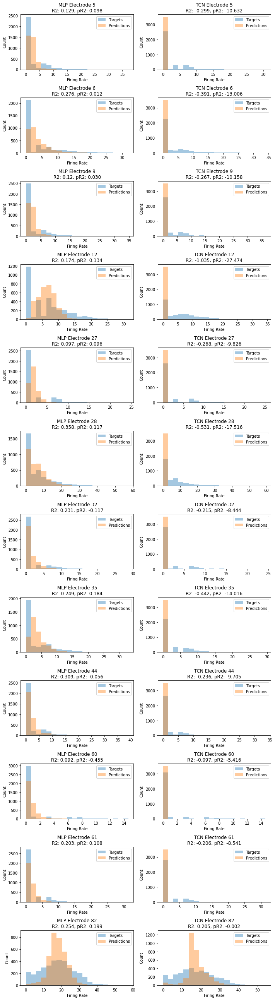

In [ ]:
visualization.plot_distributions_subset(models_dict['MLP']['20220309'], dataset_dict['20220309']['Joint Angles']['Full'], loader_dict['20220309']['Joint Angles']['Test'],models_dict['TCN']['20220309'], tcnn_dataset_dict['20220309']['Joint Angles']['Full'], tcnn_loader_dict['20220309']['Joint Angles']['Test'], tcn_worse['20220309'], len(tcn_worse['20220309']))

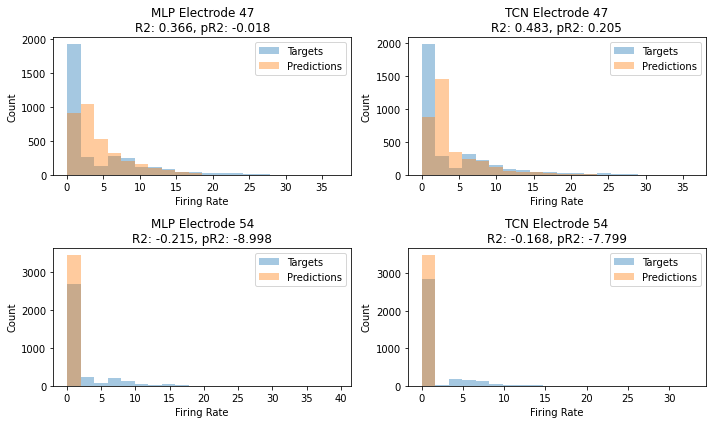

In [ ]:
visualization.plot_distributions_subset(models_dict['MLP']['20220309'], dataset_dict['20220309']['Joint Angles']['Full'], loader_dict['20220309']['Joint Angles']['Test'], models_dict['TCN']['20220309'], tcnn_dataset_dict['20220309']['Joint Angles']['Full'], tcnn_loader_dict['20220309']['Joint Angles']['Test'], mlp_worse['20220309'], len(mlp_worse['20220309']))

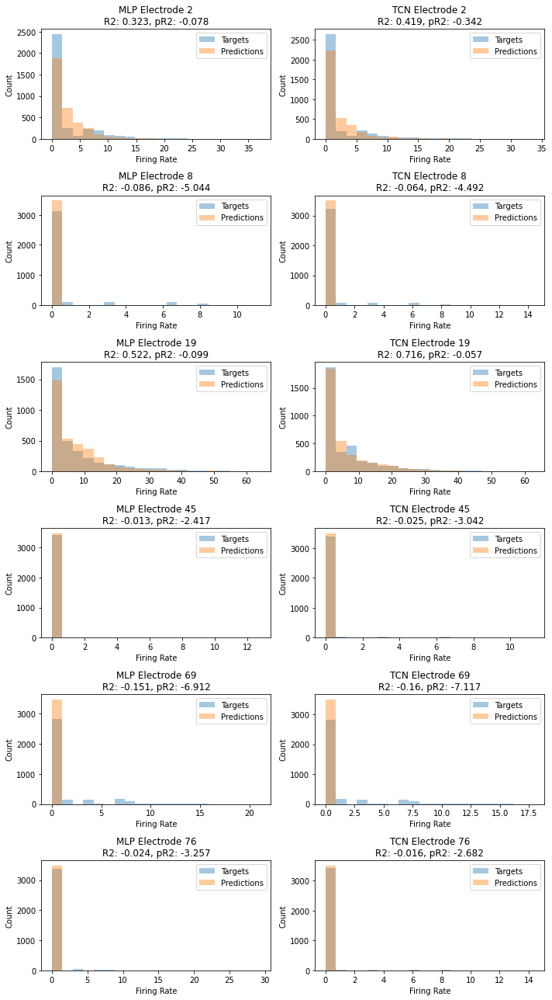

In [ ]:
visualization.plot_distributions_subset(models_dict['MLP']['20220309'], dataset_dict['20220309']['Joint Angles']['Full'], loader_dict['20220309']['Joint Angles']['Test'], models_dict['TCN']['20220309'], tcnn_dataset_dict['20220309']['Joint Angles']['Full'], tcnn_loader_dict['20220309']['Joint Angles']['Test'], both_bad['20220309'], len(both_bad['20220309']))

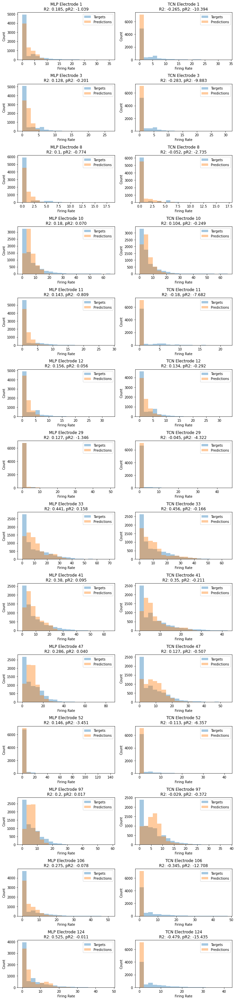

In [ ]:
visualization.plot_distributions_subset(models_dict['MLP']['20210712'], dataset_dict['20210712']['Joint Angles']['Full'], loader_dict['20210712']['Joint Angles']['Test'],models_dict['TCN']['20210712'], tcnn_dataset_dict['20210712']['Joint Angles']['Full'], tcnn_loader_dict['20210712']['Joint Angles']['Test'], tcn_worse['20210712'], len(tcn_worse['20210712']))